In [99]:
from astropy.io import fits
import numpy as np
import os
import matplotlib.pyplot as plt
from astropy.stats import SigmaClip
from photutils.background import Background2D, SExtractorBackground
from mpl_toolkits.axes_grid1 import make_axes_locatable
from astropy.visualization import LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from scipy import ndimage
from scipy.ndimage import gaussian_filter
import little_things_functions as ltf
import cv2
from scipy.optimize import curve_fit
from matplotlib.patches import Ellipse


# DDO 43

## R_25

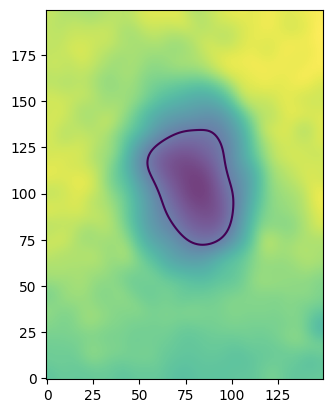

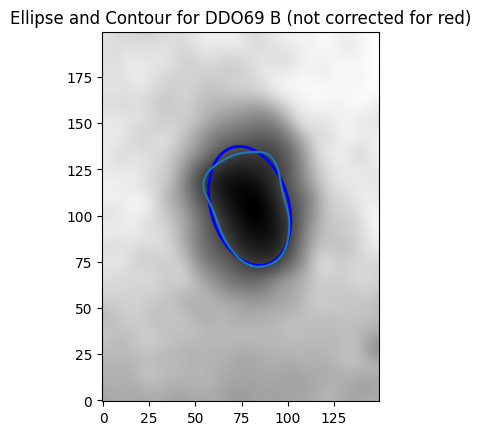

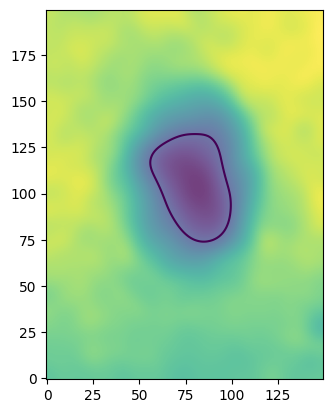

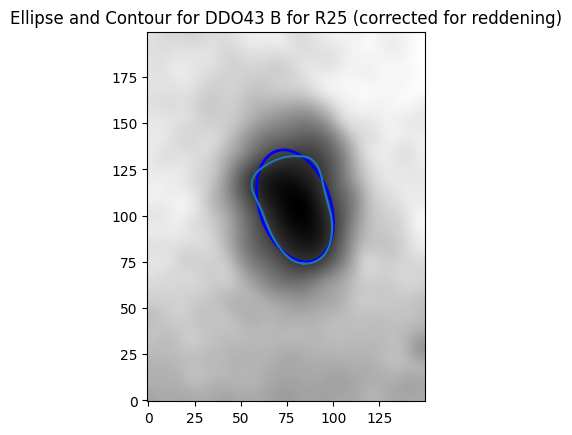

NOT corrected RB 25 for DDO43 is: 0.9975854395204415 kpc
CORRECTED RB 25 for DDO43 is: 0.9467168241981757 kpc
Paper value is 0.98 kpc
CORRECTED RB 25 for DDO43: 0.947 ± 0.009 kpc


In [100]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43v.fits")
starless_v = starless_file_v[0].data

DDO43 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO43"
# Constants and parameters
pixel_scale = 1.134
D = 5.5
E_B_V = 0.05 
filters = ["U", "B", "V"]
exposures = [1800, 1800, 900]
airmass_values = [1.33, 1.04 ,1.16]
mU_values = [5.251, 0.459, -0.121, 0.]
mV_values = [33.017, 0.137418, 0.045, 0.]
mB_values = [3.445, 0.2522084, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 75
box_size_y = 100
box_center = (450, 460)
image_boxes = [DDO43[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO43))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 


# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"NOT corrected RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 0.98 kpc")
# Extract uncertainty in b_c from covariance matrix
sigma_b = np.sqrt(np.diag(pcov_25_c))[3]  # index 3 corresponds to b_c

# Propagate error into RB_25
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b * 1000  # convert to kpc

print(f"CORRECTED RB 25 for {galaxy_name}: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")


## R_H

Median of the center box: 30.205615497433673


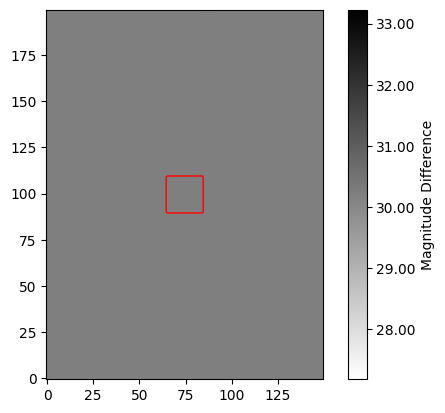

Holmberg mag threshold is 26.72


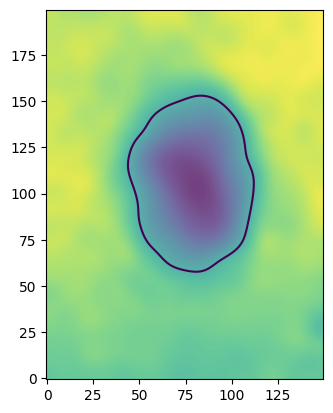

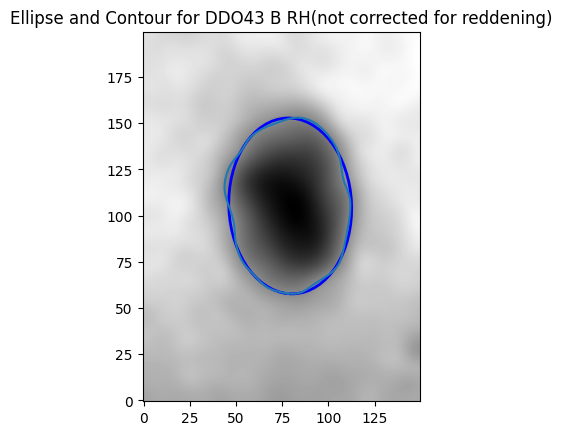

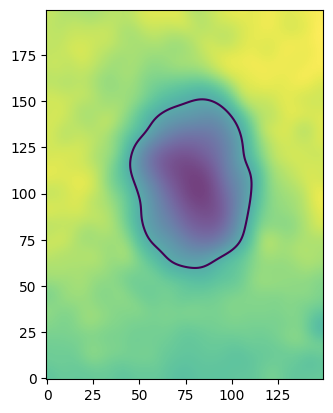

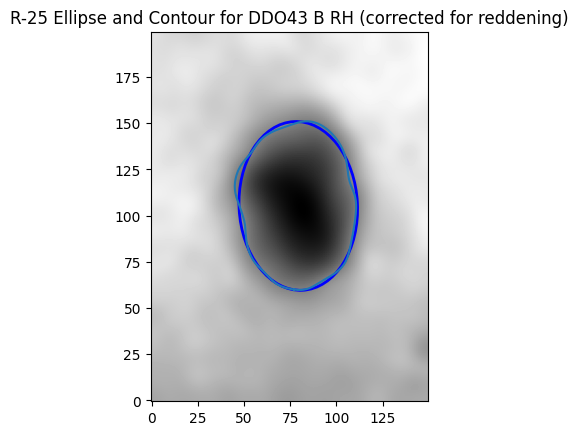

NOT corrected RH for DDO43 is: 1.4391854722706625 kpc
CORRECTED RB 25 for DDO43 is: 1.3816813077052752 kpc
Paper value is 1.42 kpc
CORRECTED RH for DDO43 is: 1.382 ± 0.005 kpc
Paper value is 1.42 kpc


In [101]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)
plt.show()

#Holmberg magnitude:
H = float(26.5 + 0.22)
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = b_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 1.42 kpc")

# Error estimation for RH_c
sigma_b_c_H = np.sqrt(np.diag(pcov_25_c_H))[3]  # index 3 corresponds to b_c_H
sigma_RH_c = (D * pixel_scale / 206265) * sigma_b_c_H * 1000  # convert to kpc

print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 1.42 kpc")


# DDO 46

# R25

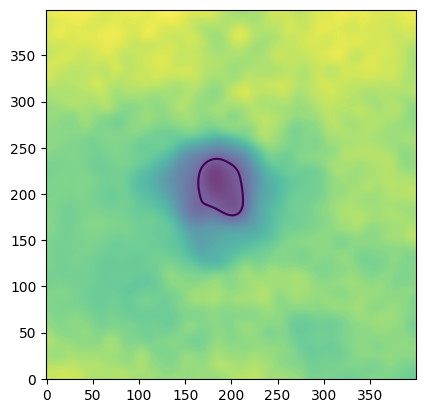

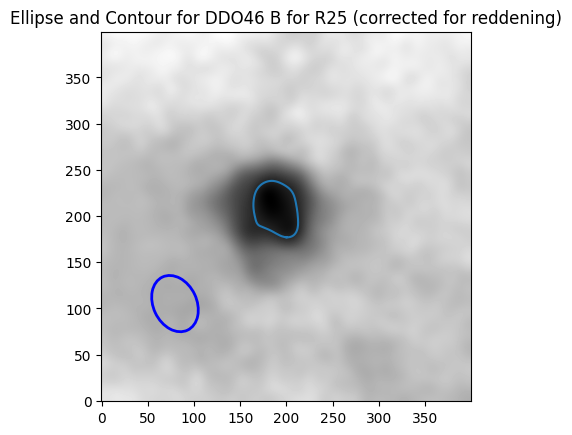

CORRECTED RB 25 for DDO46 is: 0.9606093868541583 kpc
Paper value is 1.18 kpc
CORRECTED RB 25 for DDO46 is: 0.961 ± 0.006 kpc
Paper value is 1.18 kpc


In [102]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 46\final_d46u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 46\final_d46b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 46\final_d46v.fits")
starless_v = starless_file_v[0].data

DDO43 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO46"
# Constants and parameters
pixel_scale = 1.134
D = 5.5
E_B_V = 0.05 
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.3, 1.0, 1.02]
mU_values = [5.251, 0.444, -0.121, 0.]
mV_values = [3.017, 0.1593955, 0.045, 0.]
mB_values = [3.445, 0.270116, -0.022, 0]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 200
box_size_y = 200
box_center = (480, 400)
image_boxes = [DDO43[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO43))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 7)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 7)[2]

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 



a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.18 kpc")
# Extract error for b_c from the covariance matrix
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # index 3 = b_c

# Propagate uncertainty to RB_25_c
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # convert to kpc

# Print with error included
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.18 kpc")


# RH

Median of the center box: -0.11899706646897386


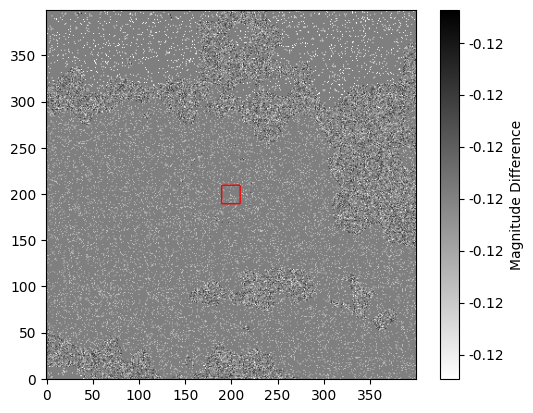

Holmberg mag threshold is 26.737730562903877


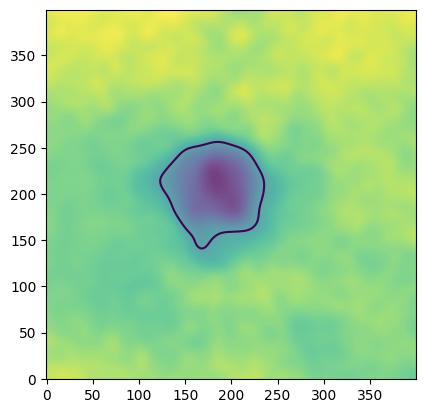

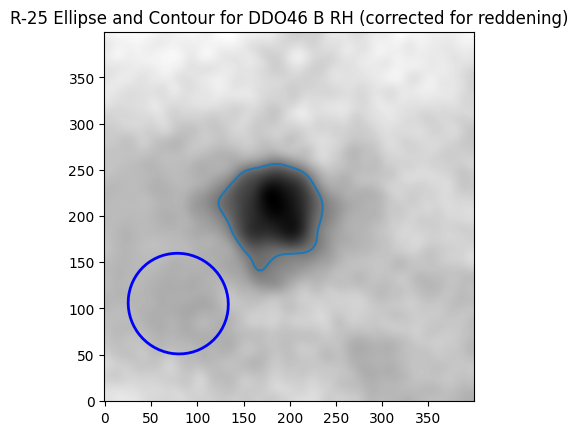

CORRECTED RB 25 for DDO46 is: 1.6570753894709402 kpc
Paper has not reported this value
CORRECTED RH for DDO46 is: 1.657 ± 0.009 kpc
Paper has not reported this value


In [103]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)
plt.show()

#Holmberg magnitude:
H = float(26.5 + 0.22 - 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")


#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c_H = b_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper has not reported this value")

# Extract the 1-sigma uncertainty on b_c_H from the covariance matrix
sigma_b_c_H = np.sqrt(np.diag(pcov_25_c_H))[3]  # index 3 = b_c_H

# Propagate into RH_c using the same scaling formula
sigma_RH_c = (D * pixel_scale / 206265) * sigma_b_c_H * 1000  # result in kpc

# Report the final value with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper has not reported this value")


# DDO 47

# R25

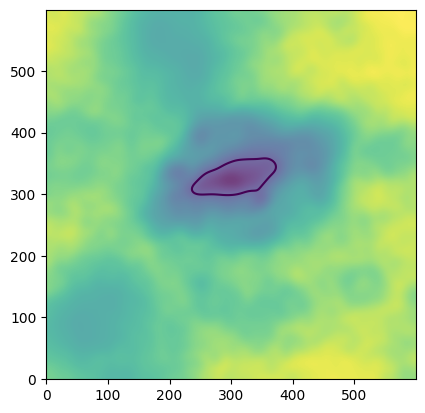

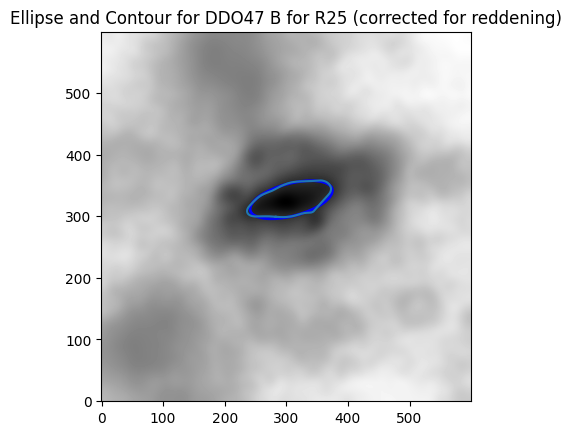

CORRECTED RB 25 for DDO47 is: 1.9659398898790865 kpc
Paper value is 1.08 kpc
CORRECTED RB 25 for DDO47 is: 1.966 ± 0.011 kpc
Paper value is 1.08 kpc


In [104]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 47\final_d47u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 47\final_d47B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 47\final_d47V.fits")
starless_v = starless_file_v[0].data

DDO101 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO47"
# Constants and parameters
pixel_scale = 1.134
D = 5.2
E_B_V = 0.02 
airmass_values=[1.25, 1.06, 1.17]
exposures = [1800, 1800, 1200]
mU_values = [5.267, 0.472, -0.125, 0.]
mB_values = [3.445, 0.2458613, -0.022, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 300
box_size_y = 300
box_center = [500,450]

image_boxes = []
for i in range(0 , len(DDO101)):
        box = DDO101[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 9)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 9)[2]

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, yc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.08 kpc")
# Extract uncertainty on a_c (index 2 in covariance matrix)
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]  # a_c uncertainty

# Propagate uncertainty into physical radius
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # in kpc

# Final output with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.08 kpc")




# RH

Median of the center box: -0.10225130446897211


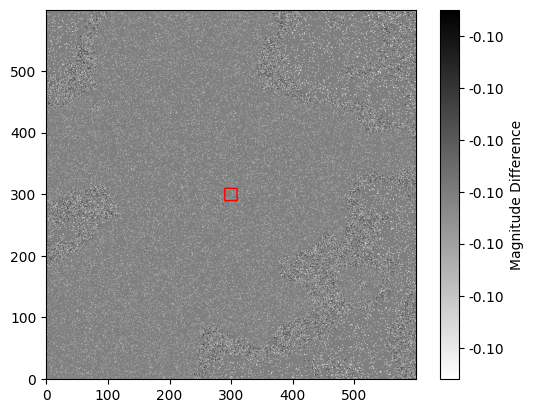

Holmberg mag threshold is 26.735235444365877


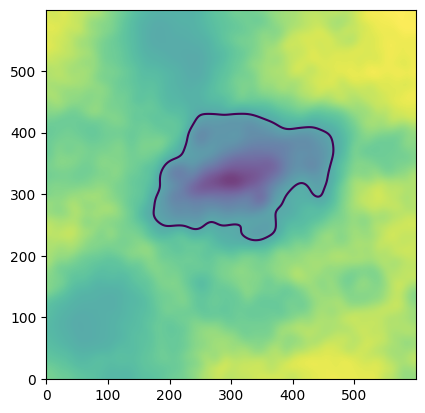

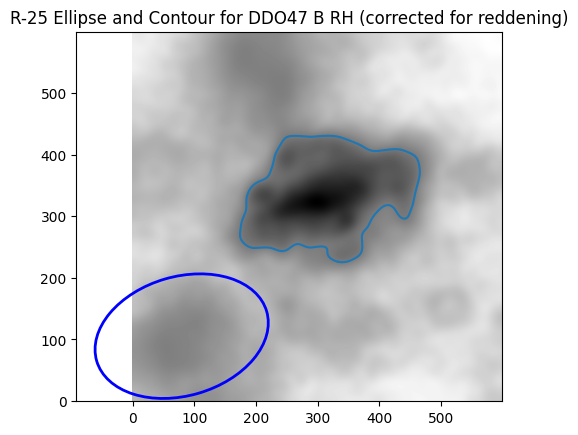

CORRECTED RB 25 for DDO47 is: 4.10869576619436 kpc
paper value is 3.39 kpc
CORRECTED RH for DDO47 is: 4.109 ± 0.026 kpc
Paper value is 3.39 kpc


In [105]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)
plt.show()

#Holmberg magnitude:
H = float(26.5 + 0.22 - 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")


#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("paper value is 3.39 kpc")

# Extract uncertainty in a_c_H from the covariance matrix
sigma_a_c_H = np.sqrt(np.diag(pcov_25_c_H))[2]  # index 2 = a_c_H

# Propagate into RH_c with error
sigma_RH_c = (D * pixel_scale / 206265) * sigma_a_c_H * 1000  # kpc

# Report corrected RH with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 3.39 kpc")


# DDO 50

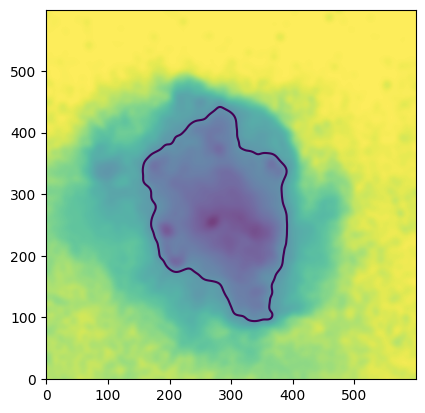

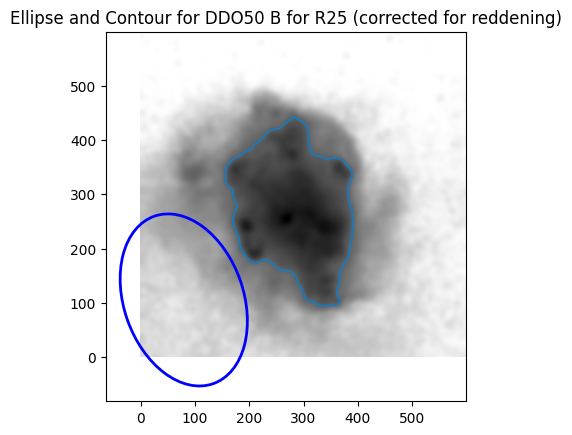

NOT corrected RB 25 for DDO50 is: 0.3936161662579915 kpc
CORRECTED RB 25 for DDO50 is: 3.056475383767417 kpc
Paper value is 2.92 kpc
CORRECTED RB 25 for DDO50 is: 3.056 ± 0.015 kpc
Paper value is 2.92 kpc


In [106]:
starless_file_u = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 50\final_d50u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 50\final_d50b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 50\final_d50v.fits")
starless_v = starless_file_v[0].data

DDO50 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO50"
# Constants and parameters
pixel_scale = 1.134
D = 3.4
E_B_V = 0.02
filters = ["U", "B", "V"]
airmass_values=[1.25, 1.06, 1.17]
exposures = [1800, 1800, 1200]
mU_values = [5.267, 0.472, -0.125, 0.]
mB_values = [3.445, 0.2458613, -0.022, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 300
box_size_y = 300
box_center = [450,500]

image_boxes = []
for i in range(0 , len(DDO50)):
        box = DDO50[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"NOT corrected RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 2.92 kpc")
# Extract the 1σ uncertainty on b_c from the covariance matrix
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # index 3 = b_c

# Propagate uncertainty into RB_25_c
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # in kpc

# Report result with error
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 2.92 kpc")


# RH

Median of the center box: -0.08225130446897211


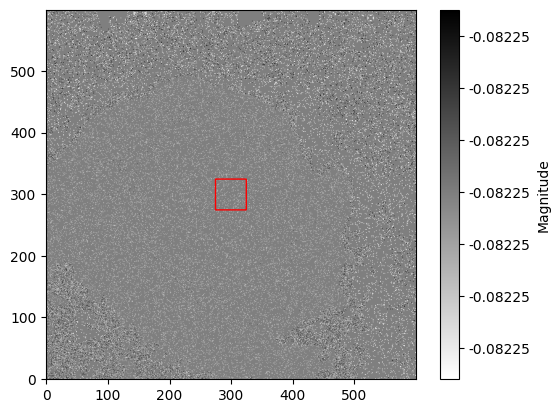

Holmberg mag threshold is 26.70774455563412


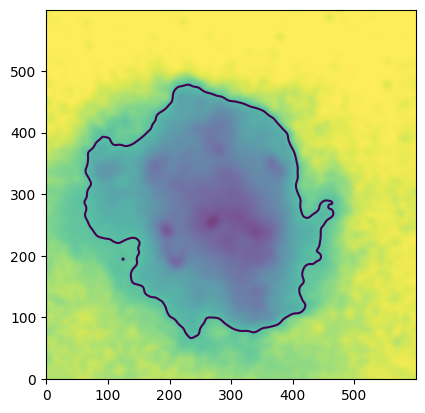

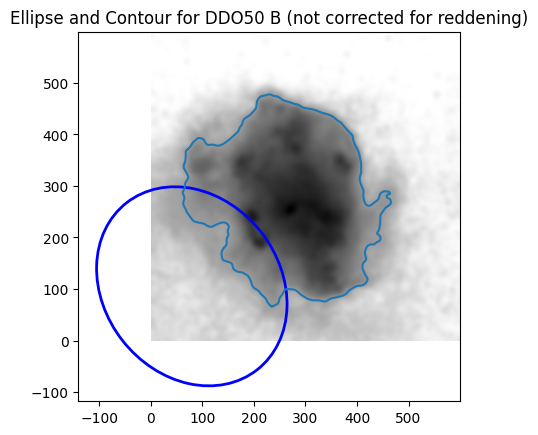

RH for DDO50 is: 3.8453678552526003 kpc
Paper value is 3.92 kpc
RH for DDO50 is: 3.845 ± 0.015 kpc
Paper value is 3.92 kpc


In [107]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 3.92 kpc")
# Extract 1σ uncertainty from the ellipse fit (index 3 = b_H)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]

# Propagate into RH using linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # in kpc

# Print with uncertainty
print(f"RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 3.92 kpc")


# DDO 52

# R25

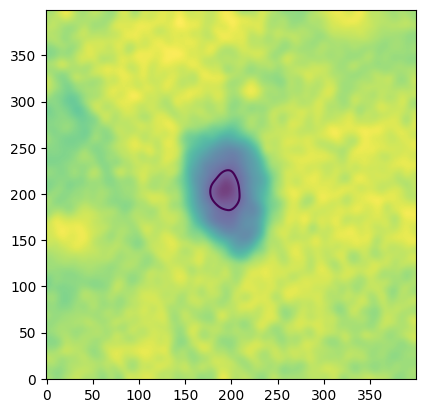

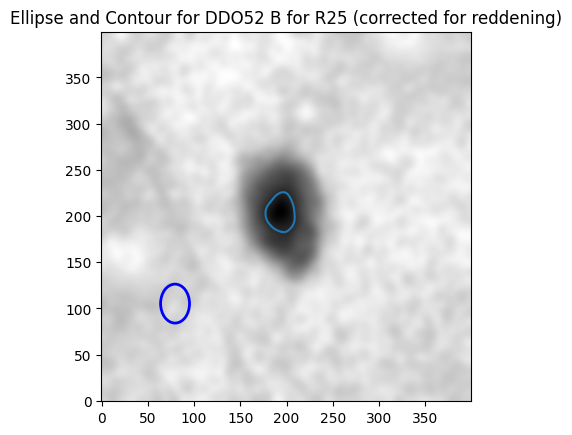

CORRECTED RB 25 for DDO52 is: 0.6955104068801256 kpc
Paper value is 0.79 kpc
CORRECTED R_B25 for DDO52 is: 0.696 ± 0.005 kpc
Paper value is 0.79 kpc


In [108]:
starless_file_u = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 52\final_d52u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 52\final_d52B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 52\final_d52V.fits")
starless_v = starless_file_v[0].data

DDO52 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO52"
# Constants and parameters
pixel_scale = 1.134
D = 6
E_B_V = 0.03
filters = ["U", "B", "V"]
airmass_values=[1.11, 1.05,1.28]
exposures = [1800, 1800, 900]
mU_values = [5.323316, 0.4120857, -0.0766, 0.]
mB_values = [3.693181, 0.2014288, -0.01482657, 0.]
mV_values = [3.261257, 0.1071445, -0.01082438, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 200
box_size_y = 200
box_center = [530, 520]

image_boxes = []
for i in range(0 , len(DDO52)):
        box = DDO52[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 0.79 kpc")
# Extract uncertainty on b_c (index 3 in covariance matrix)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # σ_b from fitting

# Propagate error into R_B25
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # kpc

# Final result with uncertainty
print(f"CORRECTED R_B25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 0.79 kpc")


# RH

Median of the center box: 0.22466442225582384


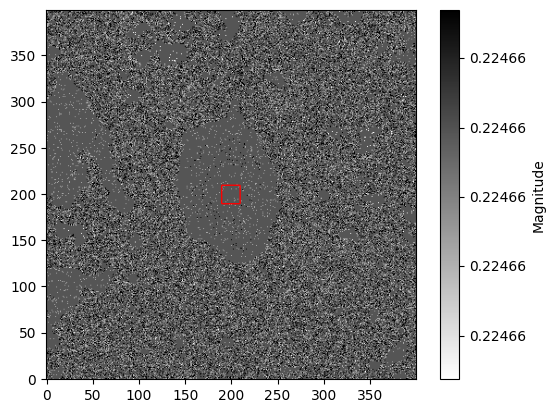

Holmberg mag threshold is 26.753474998916115


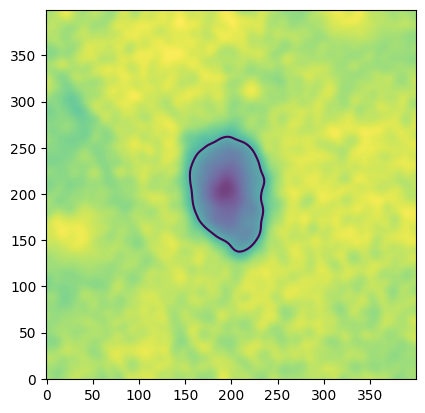

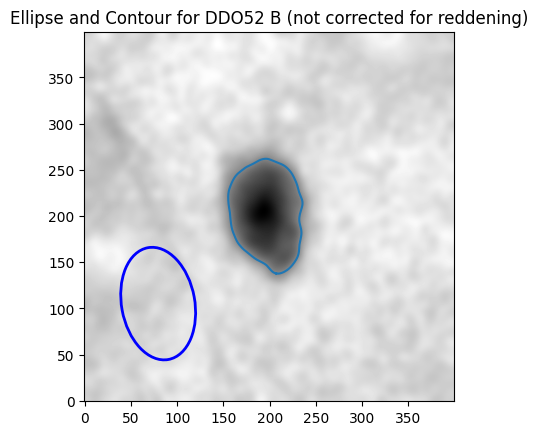

RH for DDO52 is: 2.0286379754104833 kpc
Paper value is 1.89 kpc
Holmberg RH for DDO52 is: 2.029 ± 0.010 kpc
Paper value is 1.89 kpc


In [109]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 1.89 kpc")
# Extract the 1σ uncertainty in b_H from the covariance matrix
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # index 3 corresponds to b_H

# Propagate error into RH using standard linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # convert to kpc

# Print RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 1.89 kpc")


# DDO 63

# R25

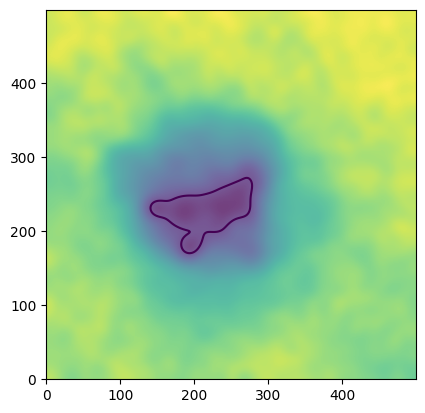

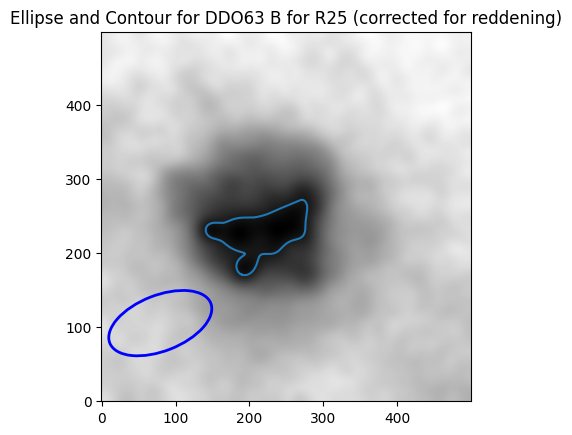

CORRECTED RB 25 for DDO63 is: 1.5343073538873346 kpc
Paper value is 1.43 kpc
CORRECTED RB 25 for DDO63 is: 1.534 ± 0.040 kpc
Paper value is 1.43 kpc


In [110]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 63\final_d63u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 63\final_d63B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 63\final_d63V.fits")
starless_v = starless_file_v[0].data

DDO63 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO63"
# Constants and parameters
pixel_scale = 1.134
D = 3.8
E_B_V = 0.01
filters = ["U", "B", "V"]
airmass_values=[1.36, 1.42, 1.49]
exposures = [1800, 1900, 1200]
mU_values = [5.172179, 0.5305759, -0.1119325, 0.]
mB_values = [3.661739, 0.2671157, -0.01449246, 0.]
mV_values = [3.206747, 0.1810213, -0.01222482, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 250
box_size_y = 250
box_center = [500, 500]

image_boxes = []
for i in range(0 , len(DDO63)):
        box = DDO63[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 9)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 9)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.43 kpc")
# Extract 1σ uncertainty on a_c (index 2 in covariance matrix)
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]

# Propagate into RB_25_c using linear error formula
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # convert to kpc

# Final report with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.43 kpc")


# RH

Median of the center box: -0.07718376509980018


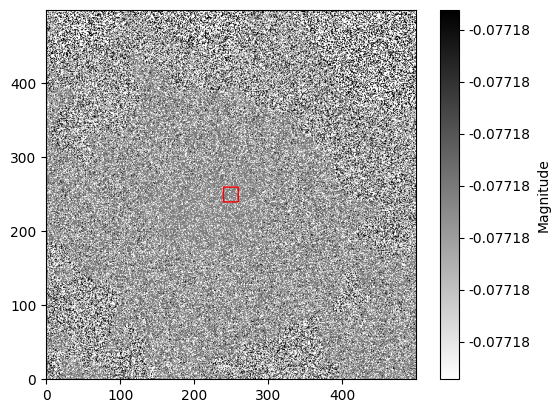

Holmberg mag threshold is 26.70849961900013


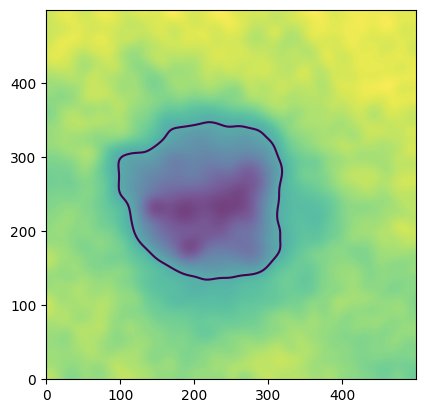

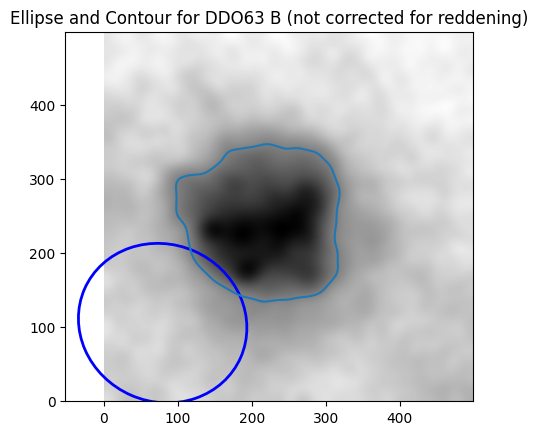

RH for DDO63 is: 2.4093895332539215 kpc
Paper value is 2.4 kpc
Holmberg RH for DDO63 is: 2.409 ± 0.009 kpc
Paper value is 2.4 kpc


In [111]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.4 kpc")
# Extract 1σ uncertainty on a_H (index 2 in covariance matrix)
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]

# Propagate into RH using linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000  # convert to kpc

# Report final result with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 2.4 kpc")



# DDO 69

## R25

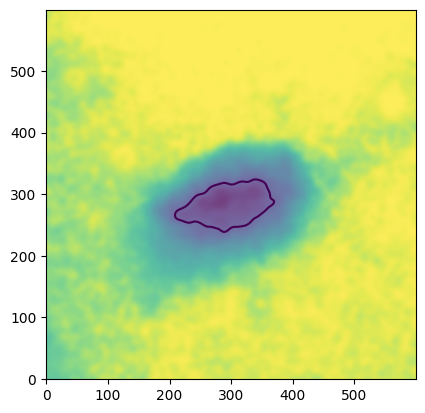

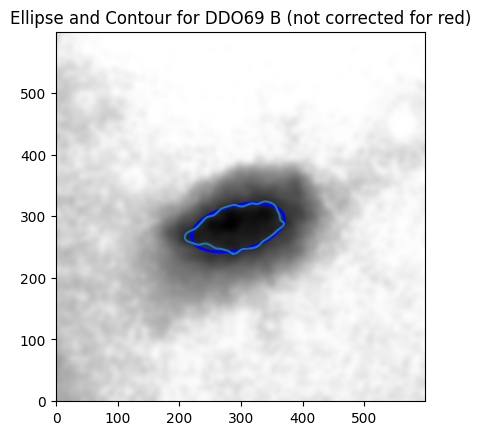

RB 25 for DDO69 is: 0.3387897360264195 kpc
Paper value is 0.30 kpc
RB 25 for DDO69 is: 0.339 ± 0.002 kpc
Paper value is 0.30 kpc


In [112]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69v.fits")
starless_v = starless_file_v[0].data

DDO69 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO69"
# Constants and parameters
pixel_scale = 1.134
D = 0.8
E_B_V = 0.00
filters = ["U", "B", "V"]
exposures = [1800, 2400, 1200]
airmass_values = [1.22, 1.04, 1.1]
mU_values = [5.251, 0.459, -0.121, 0]
mV_values = [3.009, 0.2183592, 0.0415, 0.]
mB_values = [3.434, 0.3398903, -0.0157, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 300
box_size_y = 300
box_center = (520, 430)
image_boxes = [DDO69[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO69))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO69 is:", RB_25 * 1000, "kpc")
print("Paper value is 0.30 kpc")
# Extract the 1σ uncertainty for a from the covariance matrix
sigma_a = np.sqrt(np.diag(pcov_25))[2]  # index 2 corresponds to a

# Propagate uncertainty into RB_25
sigma_RB_25 = (D * pixel_scale / 206265) * sigma_a * 1000  # convert to kpc

# Print with error
print(f"RB 25 for {galaxy_name} is: {RB_25 * 1000:.3f} ± {sigma_RB_25:.3f} kpc")
print("Paper value is 0.30 kpc")


Median of the center box: 0.24422993453990216


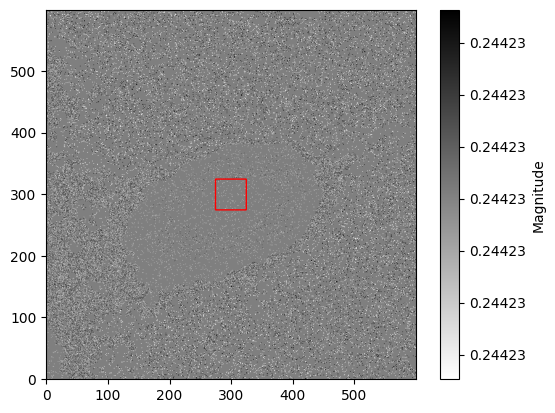

Holmberg mag threshold is 26.756390260246445


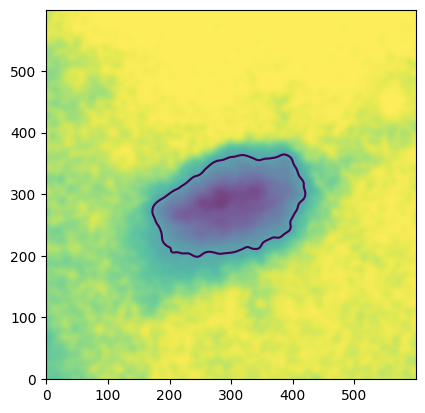

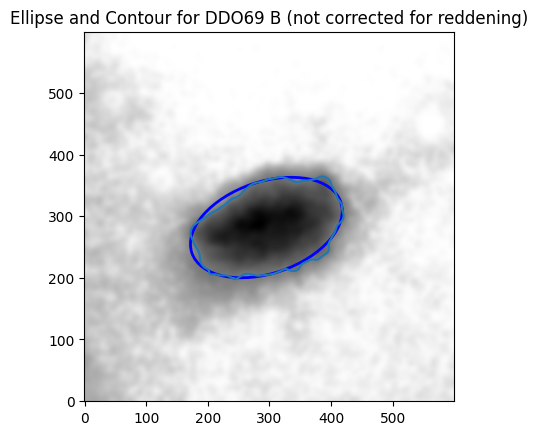

RH for DDO69 is: 0.561729771996861 kpc
Paper value is 0.56 kpc
Holmberg RH for DDO69 is: 0.562 ± 0.002 kpc
Paper value is 0.56 kpc


In [113]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.56 kpc")
# Extract the 1σ uncertainty on a_H from the covariance matrix
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]  # index 2 corresponds to a_H

# Propagate uncertainty into RH
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000  # convert to kpc

# Print result with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 0.56 kpc")


# DDO 87

# R25

CORRECTED RB 25 for DDO87 is: 1.4734055705039633 kpc
not reported
Estimated RB 25 for DDO87 is: 1.473 ± 0.074 kpc


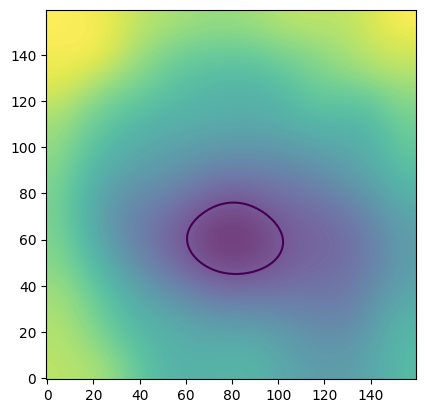

In [114]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 87\final_d87u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 87\final_d87B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 87\final_d87V.fits")
starless_v = starless_file_v[0].data

DDO87 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO87"
# Constants and parameters
pixel_scale = 1.134
D = 6.7
E_B_V = 0.00
filters = ["U", "B", "V"]
airmass_values=[1.17, 1.15, 1.18]
exposures = [1800, 2400, 1200]
mU_values = [5.285, 0.598,-0.177, 0.]
mB_values = [3.443, 0.2235634, -0.0187, 0.]
mV_values = [3.122, 0.1285986, -0.0159, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 80
box_size_y = 80
box_center = [460, 500]

image_boxes = []
for i in range(0 , len(DDO87)):
        box = DDO87[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)
#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
'''
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 
'''
#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = 40 * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("not reported")
# Set estimated uncertainty in pixels
sigma_a = 2  # pixels

# Propagate into RB_25 error
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a * 1000  # in kpc

# Final report
print(f"Estimated RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")


# RH

Median of the center box: 0.3244726791296024


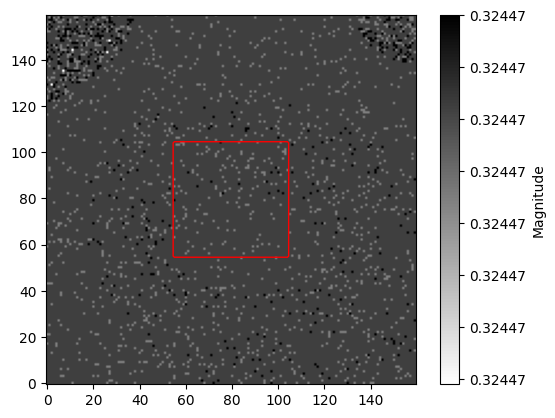

Holmberg mag threshold is 26.76834642919031


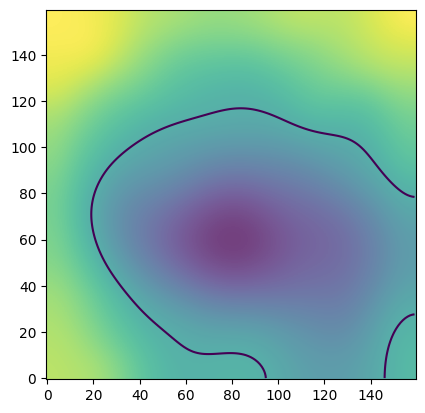

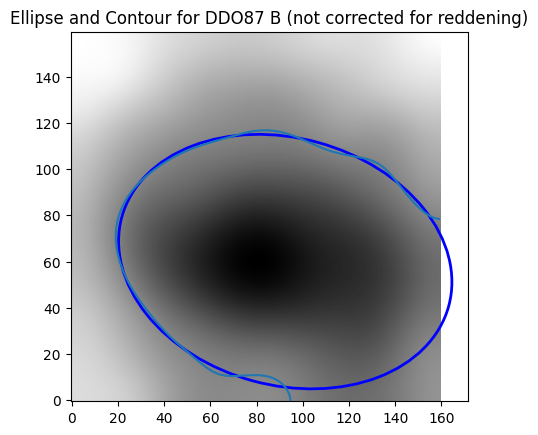

RH for DDO87 is: 1.970302057355812 kpc
Paper value is 2.24 kpc
Holmberg RH for DDO87 is: 1.970 ± 0.004 kpc
Paper value is 2.24 kpc


In [115]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.24 kpc")

# Extract 1σ uncertainty on b_H (index 3 in covariance matrix)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]

# Propagate into RH using standard linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # convert to kpc

# Report RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 2.24 kpc")


# DDO 101

## R_25

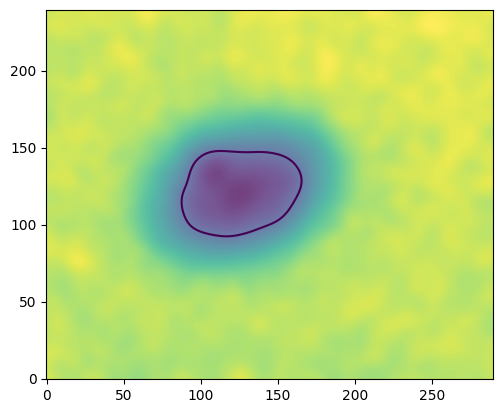

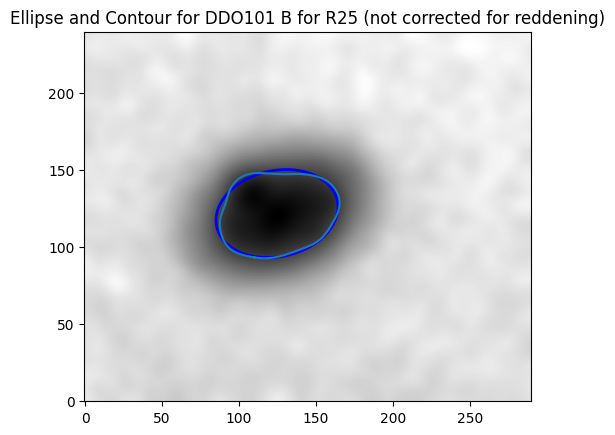

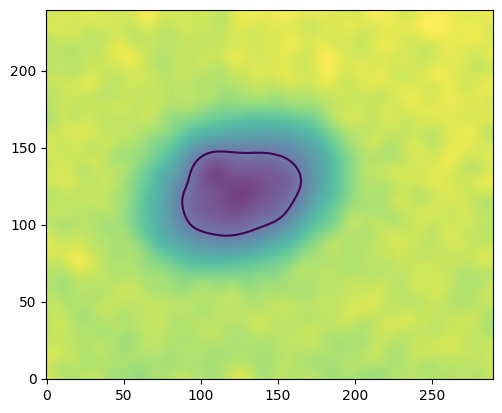

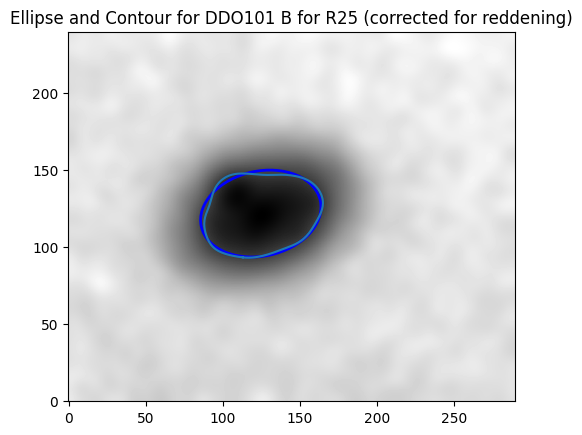

NOT corrected RB 25 for DDO101 is: 1.9818216200568466 kpc
CORRECTED RB 25 for DDO101 is: 1.9559754234607127 kpc
Paper value is 1.81 kpc
CORRECTED RB 25 for DDO101 is: 1.956 ± 0.011 kpc
Paper value is 1.81 kpc


In [116]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101V.fits")
starless_v = starless_file_v[0].data

DDO101 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO101"
# Constants and parameters
pixel_scale = 1.134
D = 9.0
E_B_V = 0.01
airmass_values=[1.03, 1.015, 1.09]
exposures = [1800, 1800, 1200]
mU_values = [5.065, 0.514, -0.146, 0.]
mB_values = [3.445, 0.2373955, -0.022, 0.]
mV_values = [3.017, 0.1283061, 0.045, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 145
box_size_y = 120
box_center = [450,500]

image_boxes = []
for i in range(0 , len(DDO101)):
        box = DDO101[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]
# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"NOT corrected RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.81 kpc")

# Extract 1σ uncertainty on a_c (index 2 in the covariance matrix)
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]  # semi-major axis uncertainty

# Propagate the uncertainty into RB_25_c
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # result in kpc

# Print corrected RB_25 with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.81 kpc")



## R_H

Median of the center box: -0.07900230746897051


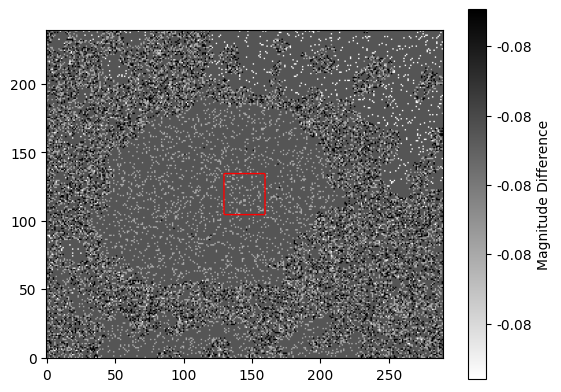

Holmberg mag threshold is 26.70822865618712


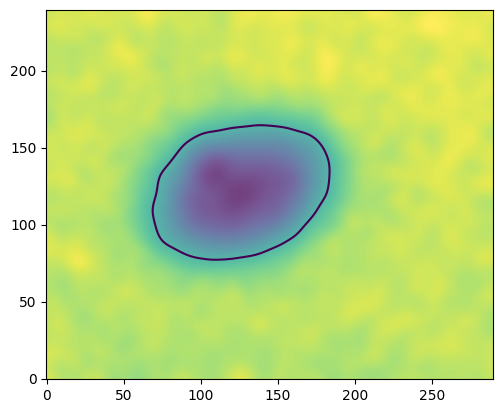

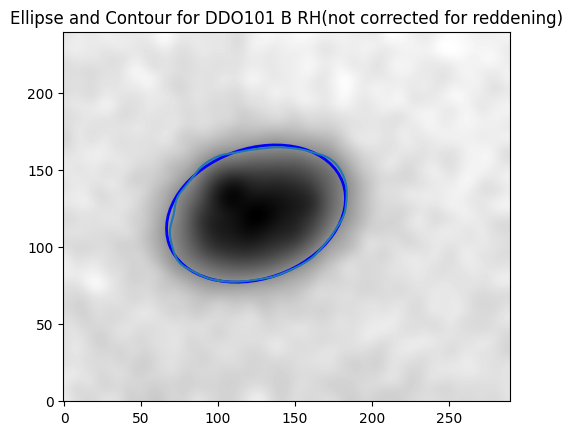

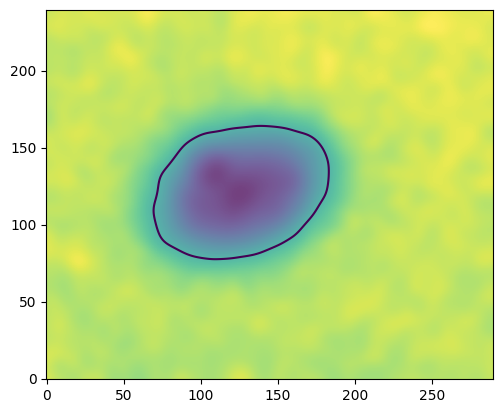

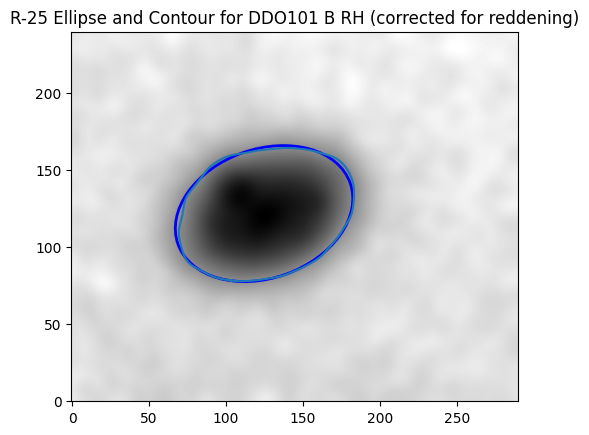

NOT corrected RH for DDO101 is: 2.959571255304675 kpc
CORRECTED RB 25 for DDO101 is: 2.934496988001718 kpc
Paper value is 2.76 kpc
CORRECTED RH for DDO101 is: 2.934 ± 0.006 kpc
Paper value is 2.76 kpc


In [117]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 2.76 kpc")
# Extract uncertainty from ellipse fit (index 2 corresponds to a_c_H)
sigma_a_c_H = np.sqrt(np.diag(pcov_25_c_H))[2]  # 1σ uncertainty in a_c_H

# Propagate into RH using linear error propagation
sigma_RH_c = (D * pixel_scale / 206265) * sigma_a_c_H * 1000  # convert to kpc

# Print with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 2.76 kpc")


# DD0126

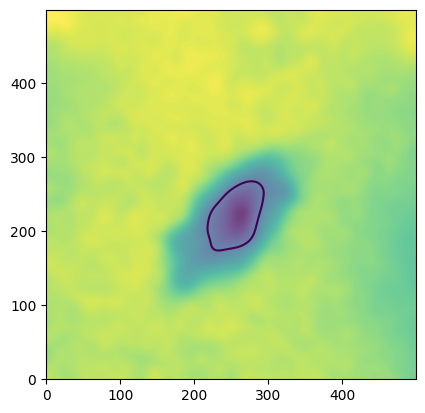

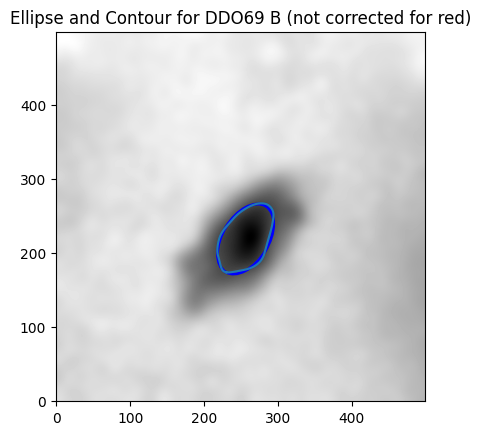

RB 25 for DDO 126 is: 1.4036236548983632 kpc
Paper value is 1.17 kpc
RB 25 for DDO126 is: 1.404 ± 0.007 kpc
Paper value is 1.17 kpc


In [118]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126V.fits")
starless_v = starless_file_v[0].data

DDO126 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO126"
# Constants and parameters
pixel_scale = 1.134
D = 4.9
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.08, 1.00, 1.04]
mU_values = [5.203, 0.5026113, -0.0911, 0.]
mV_values = [3.246, 0.1149137, -0.0167, 0.]
mB_values = [3.668, 0.2268837, -0.0274, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (520, 460)
image_boxes = [DDO126[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO126))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 126 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.17 kpc")
# Extract 1σ uncertainty on b from ellipse fit (index 3 in pcov_25)
sigma_b = np.sqrt(np.diag(pcov_25))[3]  # uncertainty in b (pixels)

# Propagate uncertainty through the physical size formula
sigma_RB_25 = (D * pixel_scale / 206265) * sigma_b * 1000  # in kpc

# Final result with uncertainty
print(f"RB 25 for {galaxy_name} is: {RB_25 * 1000:.3f} ± {sigma_RB_25:.3f} kpc")
print("Paper value is 1.17 kpc")


Median of the center box: -0.08903141118105751


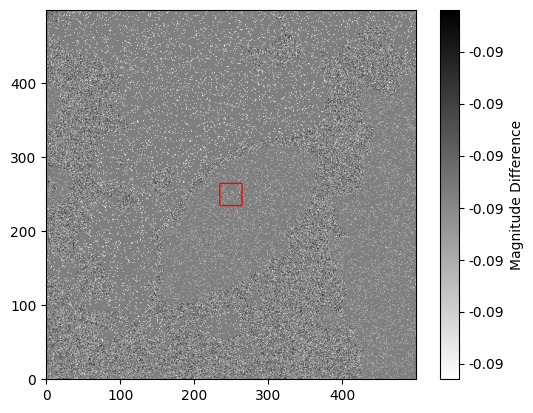

Holmberg mag threshold is 26.70673431973402


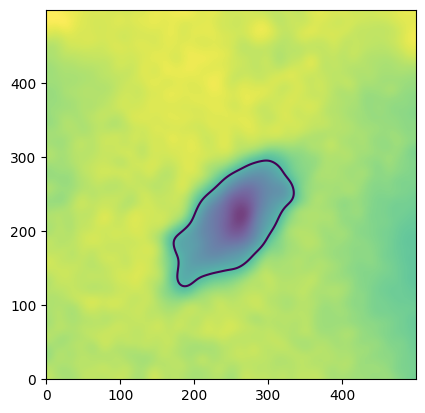

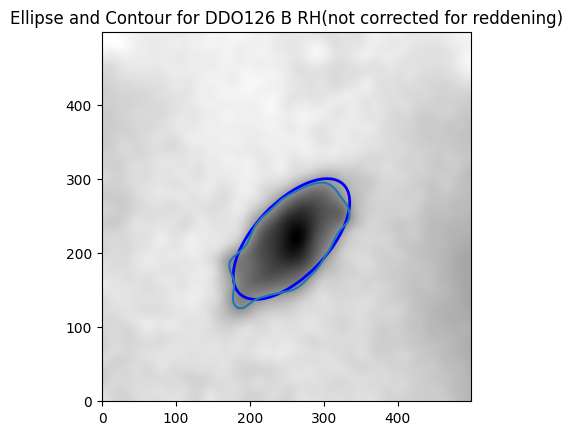

RH for DDO126 is: 2.7450079079192053 kpc
Paper value is 2.51 kpc
Holmberg RH for DDO126 is: 2.745 ± 0.010 kpc
Paper value is 2.51 kpc


In [119]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.51 kpc")
# Extract 1σ uncertainty on b_H (index 3 from pcov_25_H)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]

# Propagate uncertainty into RH (in kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Print RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 2.51 kpc")


# DDO 133

## R25

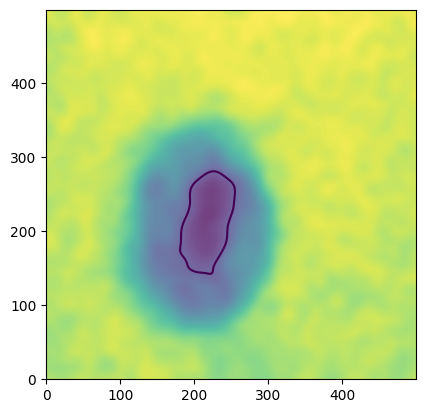

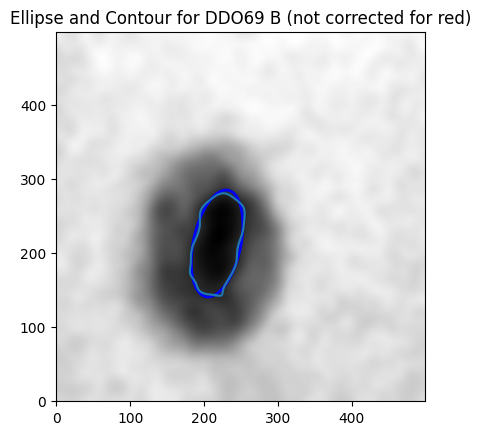

RB 25 for DDO 133 is: 2.467447669208481 kpc
Paper value is 1.89 kpc
Holmberg RH for DDO133 is: 2.745 ± 0.013 kpc
Paper value is 2.51 kpc


In [120]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133v.fits")
starless_v = starless_file_v[0].data

DDO133 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO133"
# Constants and parameters
pixel_scale = 1.134
D = 6.1
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.15, 1.0, 1.035]
mU_values = [5.203, 0.4756422, -0.0911, 0.]
mV_values = [3.246, 0.1009549, -0.0167, 0.]
mB_values = [3.668, 0.2104808, -0.0274, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (520, 430)
image_boxes = [DDO133[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO133))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 133 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.89 kpc")

# Extract 1σ uncertainty in b_H (index 3 in covariance matrix)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]

# Propagate uncertainty into RH (in kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Report result with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 2.51 kpc")



Median of the center box: -0.08658731118105578


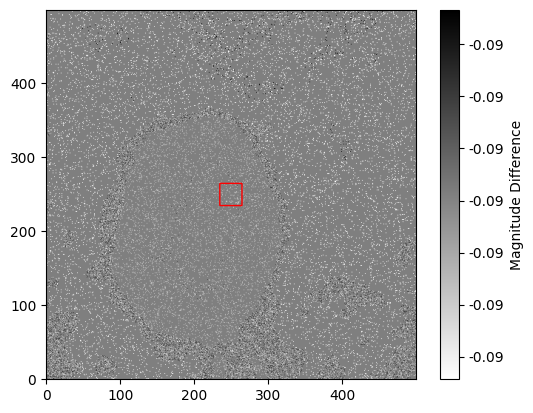

Holmberg mag threshold is 26.70709849063402


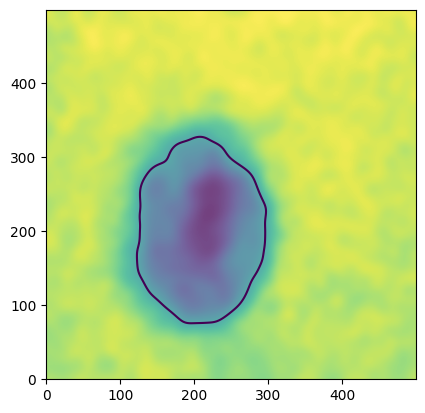

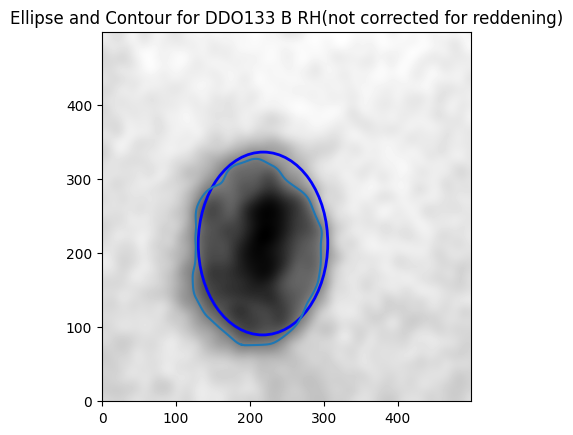

RH for DDO133 is: 4.147287266918725 kpc
Paper value is 4.14 kpc
Holmberg RH for DDO133 is: 4.147 ± 0.008 kpc
Paper value is 4.14 kpc


In [121]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 4.14 kpc")
# Extract the 1σ uncertainty on b_H from the covariance matrix
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # index 3 corresponds to b_H

# Propagate uncertainty into RH (converted to kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Final output with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 4.14 kpc")



# DDO 154

## R25

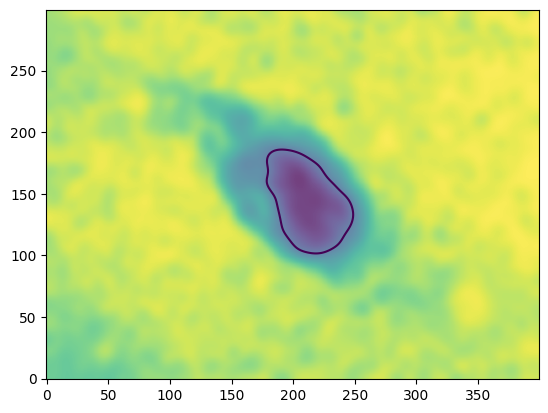

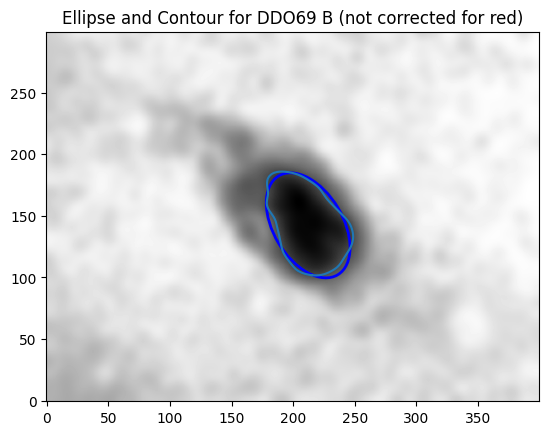

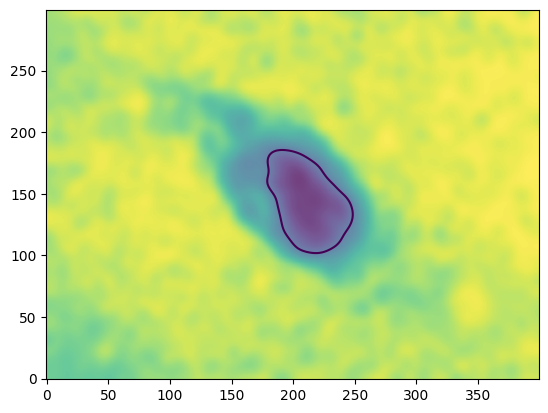

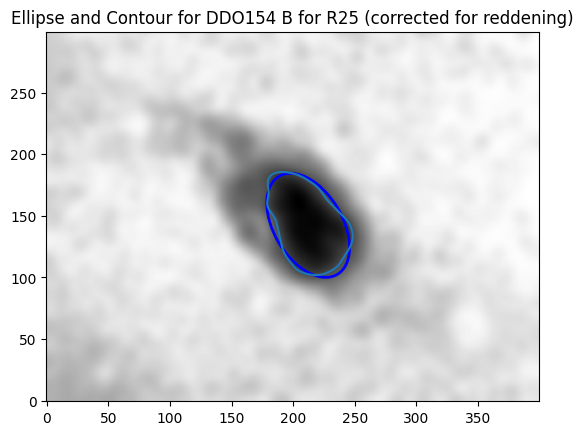

NOT corrected RB 25 for DDO 154 is: 1.1048933334630548 kpc
Paper value is 1.11 kpc
CORRECTED RB 25 for DDO154 is: 1.0940319055606036 kpc
Paper value is 1.11 kpc
CORRECTED RB 25 for DDO154 is: 1.094 ± 0.010 kpc
Paper value is 1.11 kpc


In [122]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154v.fits")
starless_v = starless_file_v[0].data

DDO154 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO154"
# Constants and parameters
pixel_scale = 1.134
D = 4.3
E_B_V = 0.01
filters = ["U", "B", "V"]
exposures = [1800, 1200, 600]
airmass_values = [1.16, 1.49, 1.11]
mU_values = [5.196, 0.4683865, -0.093, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
mB_values = [3.562, 0.2586217, -0.0166, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 200
box_size_y = 150
box_center = (460, 500)
image_boxes = [DDO154[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO154))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for DDO 154 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.11 kpc")

a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.11 kpc")

# Extract uncertainty on b_c (index 3 from ellipse fit covariance matrix)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]

# Propagate into RB_25_c (convert to kpc)
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # in kpc

# Final report with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.11 kpc")


## RH

Median of the center box: 0.05065423549220128


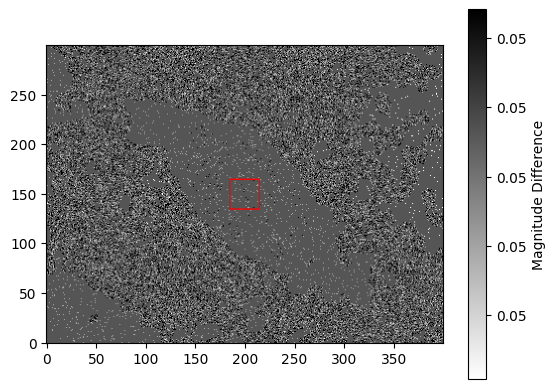

Holmberg mag threshold is 26.727547481088337


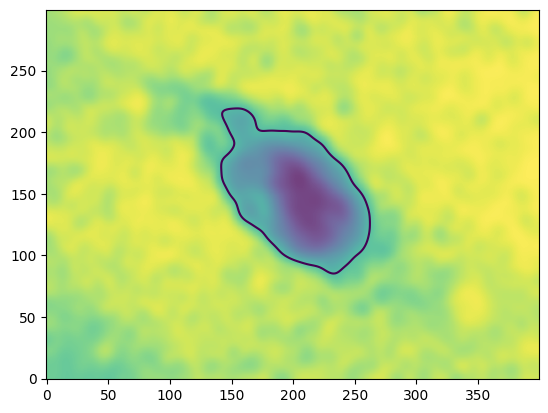

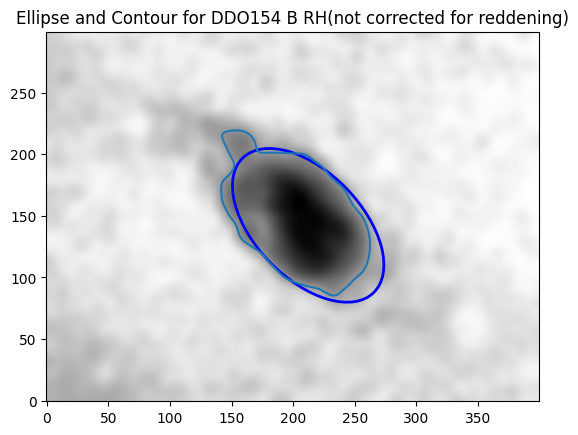

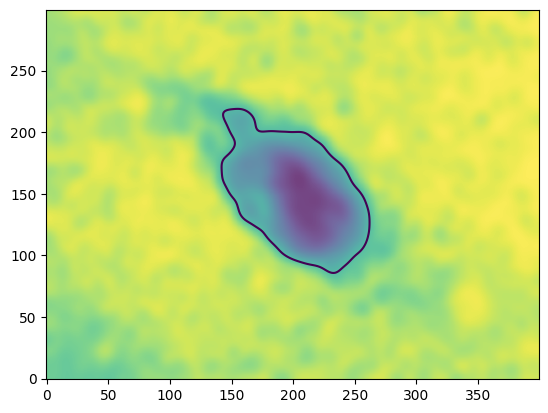

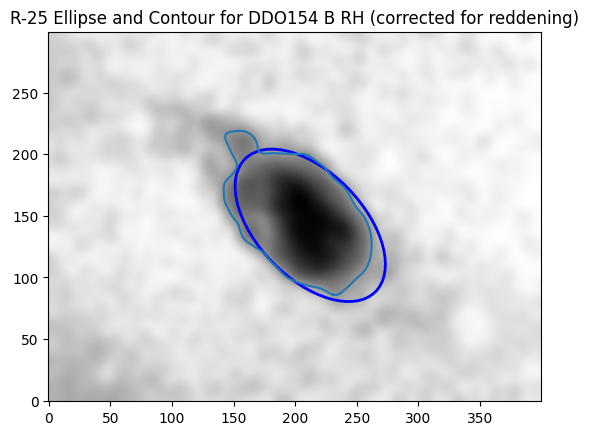

NOT corrected RH for DDO154 is: 1.801535940857117 kpc
CORRECTED RB 25 for DDO154 is: 1.785331527340605 kpc
Paper value is 1.94 kpc
CORRECTED RH for DDO154 is: 1.785 ± 0.009 kpc
Paper value is 1.94 kpc


In [123]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 200, 150
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = b_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 1.94 kpc")
# Extract 1σ uncertainty from the ellipse fit (index 3 = b_c_H)
sigma_b_c_H = np.sqrt(np.diag(pcov_25_c_H))[3]  # pixels

# Propagate into RH_c using linear error propagation
sigma_RH_c = (D * pixel_scale / 206265) * sigma_b_c_H * 1000  # convert to kpc

# Report the result with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 1.94 kpc")


# DDO 155

# R25

ValueError: max() iterable argument is empty

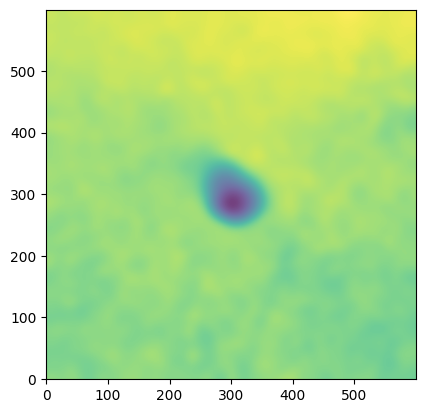

In [124]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 155\final_d155u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 155\final_d155b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 155\final_d155v.fits")
starless_v = starless_file_v[0].data

DDO155 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO155"
# Constants and parameters
pixel_scale = 1.134
D = 2.2
E_B_V = 0.01
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.22, 1.04, 1.1]
mU_values = [5.065, 0.514, -0.146, 0.]
mV_values = [3.009, 0.2203408, 0.0415, 0.]
mB_values = [3.434, 0.3580121, -0.0157, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 300
box_size_y = 300
box_center = (460, 400)
image_boxes = [DDO155[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO69))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
print("Paper value is 0.4 kpc")
# Extract 1σ uncertainty on a from the covariance matrix (index 2 = a)
sigma_a = np.sqrt(np.diag(pcov_25))[2]

# Propagate into RB_25 using linear error propagation
sigma_RB_25 = (D * pixel_scale / 206265) * sigma_a * 1000  # convert to kpc

# Report RB_25 with uncertainty
print(f"RB 25 for {galaxy_name} is: {RB_25 * 1000:.3f} ± {sigma_RB_25:.3f} kpc")
print("Paper value is 0.4 kpc")


# RH

Median of the center box: -0.102768954315831


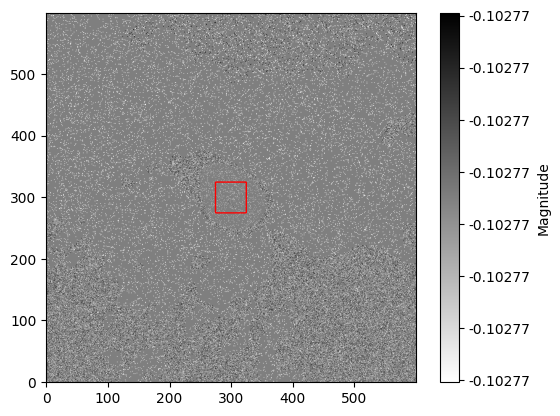

Holmberg mag threshold is 26.70468742580694


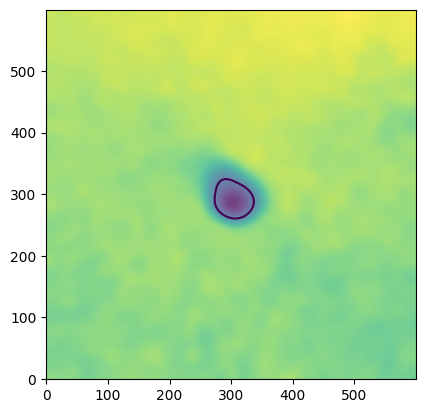

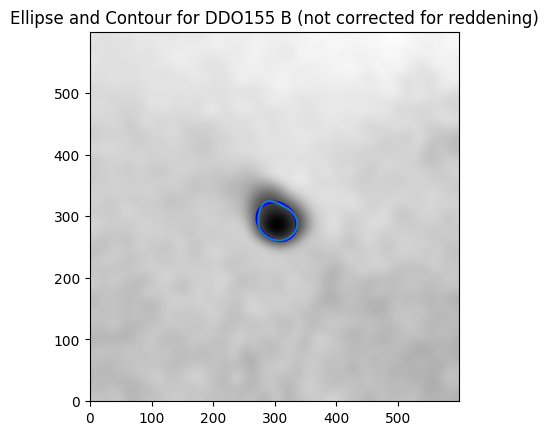

RH for DDO155 is: 0.4163090835744779 kpc
Paper value is 0.6 kpc
Holmberg RH for DDO155 is: 0.416 ± 0.002 kpc
Paper value is 0.6 kpc


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.6 kpc")
# Extract 1σ uncertainty on b_H from the covariance matrix (index 3 = b_H)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # pixels

# Propagate into RH using standard linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # kpc

# Print RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 0.6 kpc")


# DDO 165

## R25

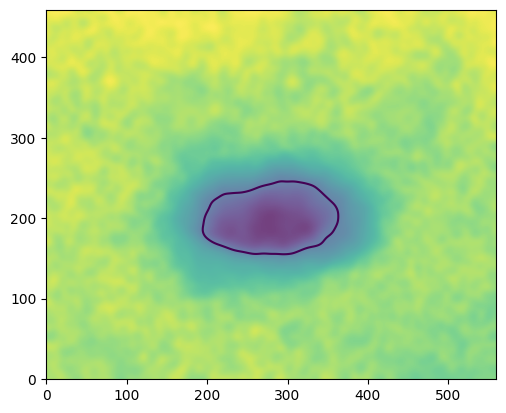

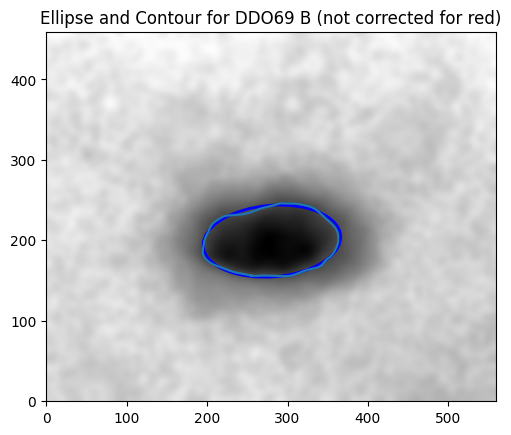

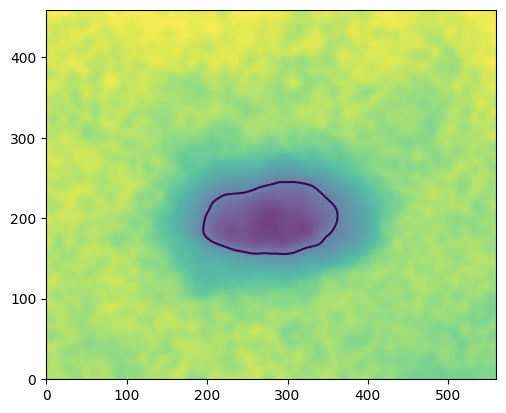

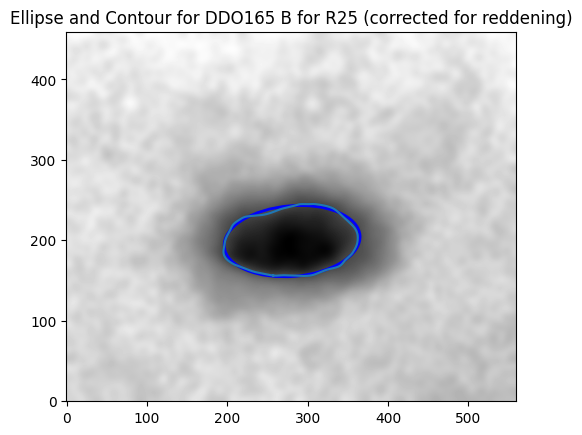

NOT corrected RB 25 for DDO 165 is: 2.262456621666036 kpc
Paper value is 1.97 kpc
CORRECTED RB 25 for DDO165 is: 2.236560322210969 kpc
Paper value is 1.97 kpc
CORRECTED RB 25 for DDO165 is: 2.237 ± 0.008 kpc
Paper value is 1.97 kpc


In [ ]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165v.fits")
starless_v = starless_file_v[0].data

DDO165 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO165"
# Constants and parameters
pixel_scale = 1.134
D = 4.8
E_B_V = 0.01
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [41.31, 1.18, 1.2]
mU_values = [5.271, 0.48, -0.143, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
mB_values = [3.445, 0.2458613, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 280
box_size_y = 230
box_center = (460, 480)
image_boxes = [DDO165[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO165))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for DDO 165 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.97 kpc")

a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.97 kpc")
# Extract 1σ uncertainty for a_c from the covariance matrix (index 2 = a_c)
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]

# Propagate into RB_25_c using standard linear error propagation
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # convert to kpc

# Final report with error
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 1.97 kpc")


## R_H

Median of the center box: -0.1062861804689723


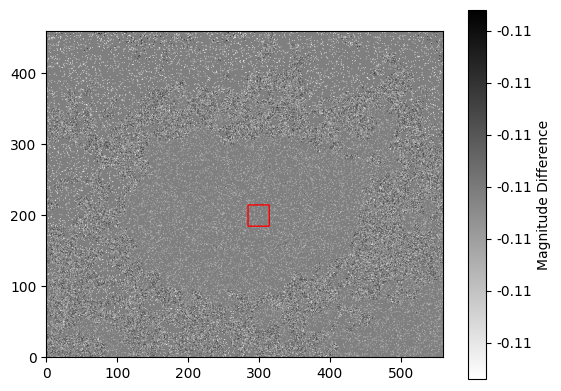

Holmberg mag threshold is 26.704163359110122


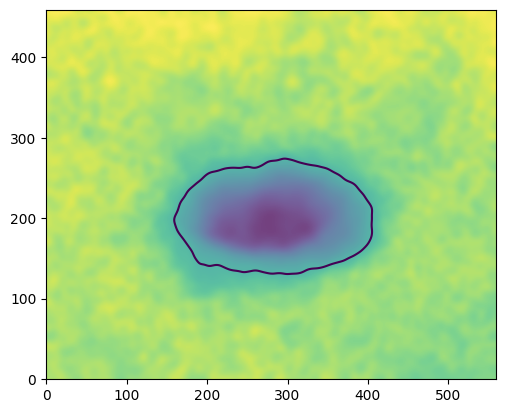

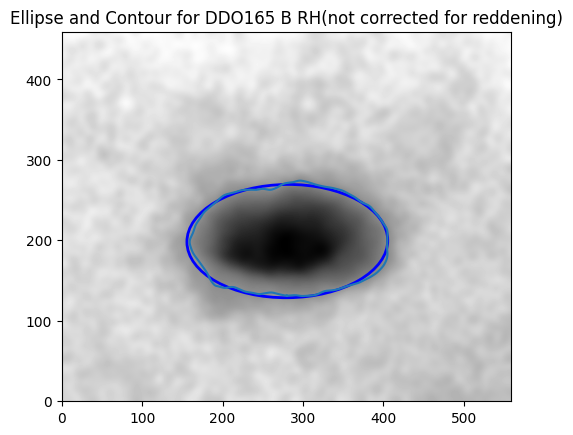

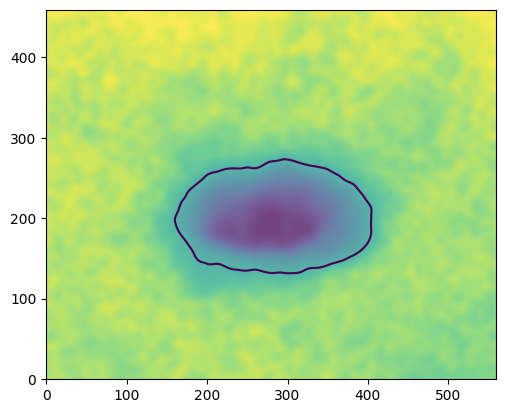

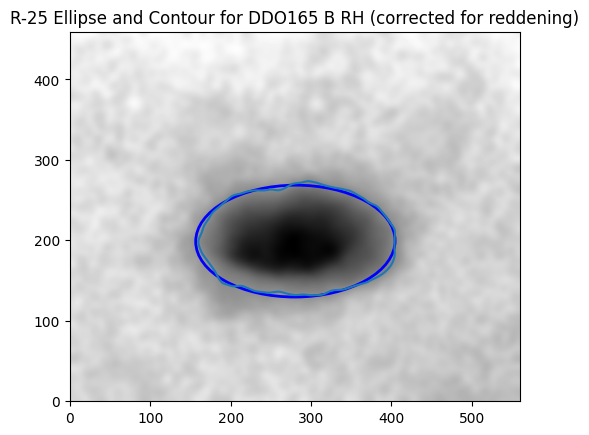

NOT corrected RH for DDO165 is: 3.297870074763445 kpc
CORRECTED RB 25 for DDO165 is: 3.2739048385202123 kpc
Paper value is 2.99 kpc
CORRECTED RH for DDO165 is: 3.274 ± 0.007 kpc
Paper value is 2.99 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 300, 200
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 2.99 kpc")
# Extract 1σ uncertainty on a_c_H from the ellipse fit
sigma_a_c_H = np.sqrt(np.diag(pcov_25_c_H))[2]  # pixels

# Propagate into RH_c using standard linear error propagation
sigma_RH_c = (D * pixel_scale / 206265) * sigma_a_c_H * 1000  # in kpc

# Report the corrected RH with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 2.99 kpc")


# DDO 167

## R25

ValueError: max() iterable argument is empty

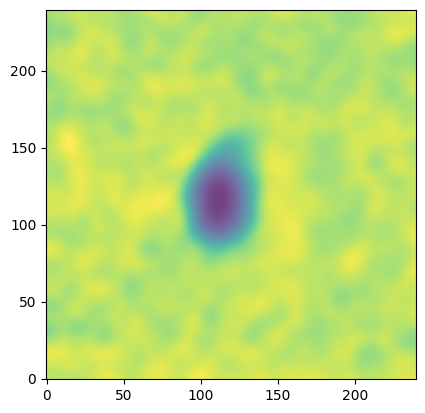

In [ ]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167v.fits")
starless_v = starless_file_v[0].data

DDO167 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO167"
# Constants and parameters
pixel_scale = 1.134
D = 4.2
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1200, 900]
airmass_values =[1.73, 1.485, 1.67]
mU_values =[5.7383, -0.04809, 0., 0.]
mV_values = [3.8163, 0.01101, 0., 0.]
mB_values = [3.2426, 0.050240, 0, 0]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 120
box_size_y = 120
box_center = (470, 460)
image_boxes = [DDO167[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO167))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO167 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 167 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.89 kpc")

# Extract 1σ uncertainty for b (index 3 in the covariance matrix)
sigma_b = np.sqrt(np.diag(pcov_25))[3]  # uncertainty in b, in pixels

# Propagate into RB_25 using linear error propagation
sigma_RB_25 = (D * pixel_scale / 206265) * sigma_b * 1000  # result in kpc

# Report RB_25 with uncertainty
print(f"RB 25 for {galaxy_name} is: {RB_25 * 1000:.3f} ± {sigma_RB_25:.3f} kpc")
print("Paper value is 1.89 kpc")



Median of the center box: 0.8277902915207491


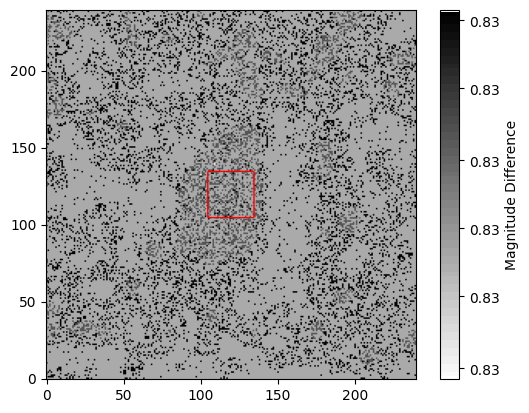

Holmberg mag threshold is 26.84334075343659


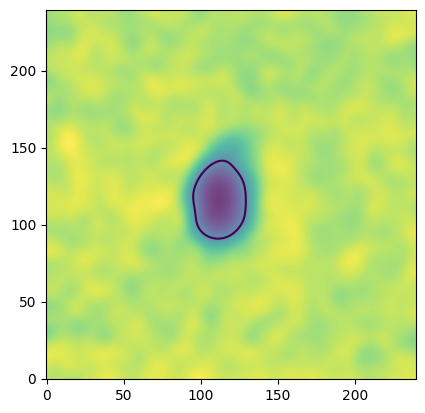

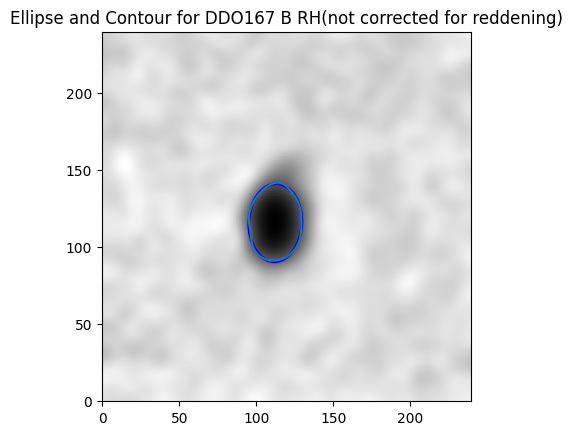

RH for DDO167 is: 0.5843045025241831 kpc
Paper value is 0.91 kpc
Holmberg RH for DDO167 is: 0.584 ± 0.002 kpc
Paper value is 0.91 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.91 kpc")
# Extract 1σ uncertainty on b_H from the ellipse fit's covariance matrix
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # index 3 corresponds to b_H

# Propagate uncertainty into RH using standard linear error propagation
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # result in kpc

# Report RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 0.91 kpc")


# DDO 168

## R25

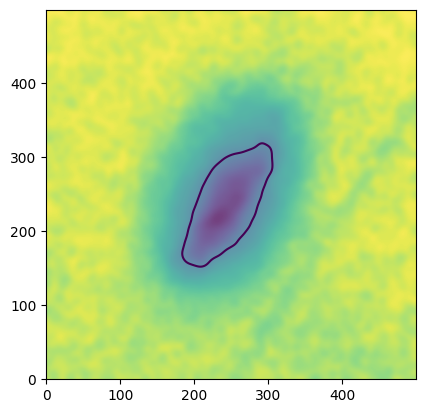

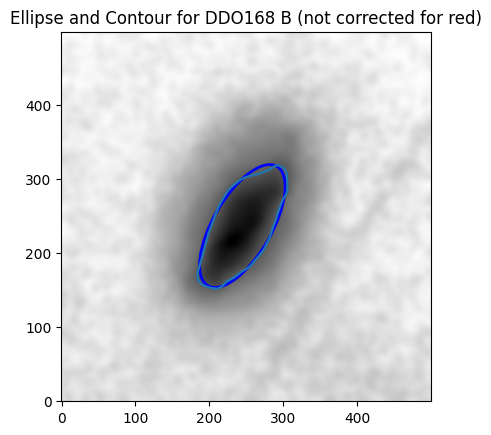

RB 25 for DDO 168 is: 1.7925754977226767 kpc
Paper value is 1.45 kpc
RB 25 for DDO168 is: 1.793 ± 0.008 kpc
Paper value is 1.45 kpc


In [ ]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168v.fits")
starless_v = starless_file_v[0].data

DDO168 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO168"
# Constants and parameters
pixel_scale = 1.134
D = 3.5
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values =[1.40, 1.09, 1.08]
mU_values =[5.065, 0.515, -0.146, 0.]
mV_values = [3.017, 0.1511767, 0.045, 0.]
mB_values = [3.445, 0.2373955, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (470, 460)
image_boxes = [DDO168[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO168))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO168 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 168 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.45 kpc")

# Extract uncertainty on b from ellipse fit
sigma_b = np.sqrt(np.diag(pcov_25))[3]  # index 3 corresponds to b

# Propagate uncertainty into RB_25
sigma_RB_25 = (D * pixel_scale / 206265) * sigma_b * 1000  # convert to kpc

# Report result with error
print(f"RB 25 for {galaxy_name} is: {RB_25 * 1000:.3f} ± {sigma_RB_25:.3f} kpc")
print("Paper value is 1.45 kpc")


Median of the center box: -0.05225505846897249


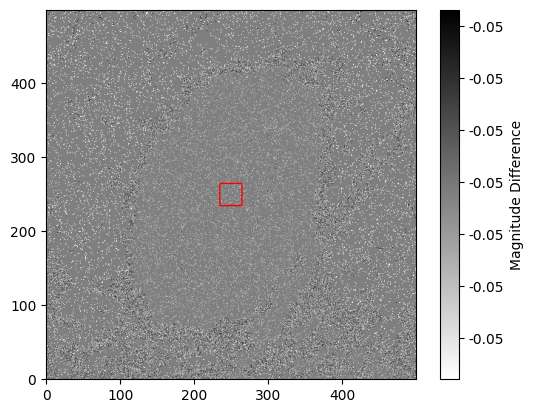

Holmberg mag threshold is 26.71221399628812


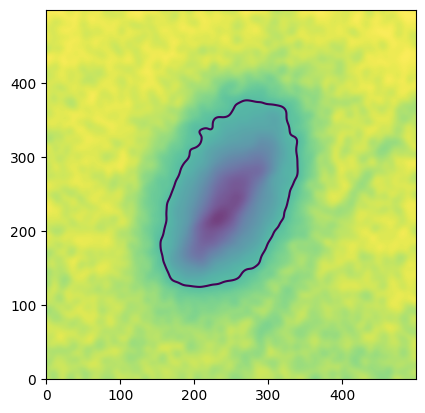

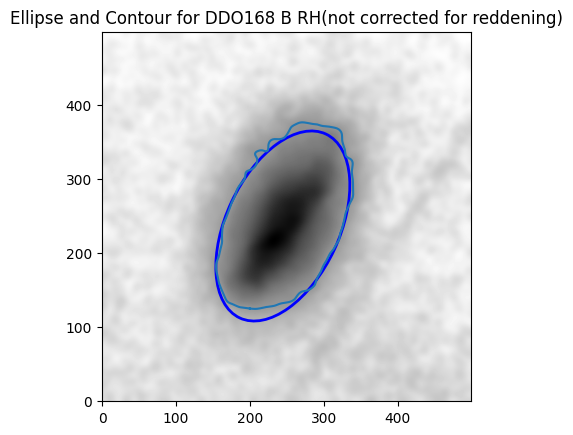

RH for DDO168 is: 2.6428673832004614 kpc
Paper value is 2.36 kpc
Holmberg RH for DDO168 is: 2.643 ± 0.005 kpc
Paper value is 2.36 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.36 kpc")

# Extract 1σ uncertainty on b_H (index 3 in covariance matrix)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]

# Propagate into RH using linear error formula
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000  # result in kpc

# Print Holmberg RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 2.36 kpc")


# DDO 187

## R25

ValueError: max() iterable argument is empty

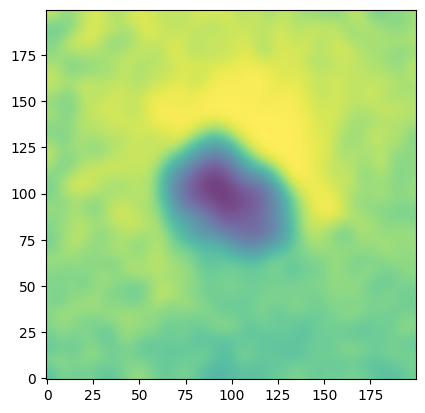

In [ ]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\final_d187u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\final_d187b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\final_d187v.fits")
starless_v = starless_file_v[0].data

DDO187 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO187"
# Constants and parameters
pixel_scale = 1.134
D = 2.5
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.21, 1.1, 1.02]
mU_values = [5.065, 0.562, -0.146, 0.]
mV_values = [3.017, 0.1511767, 0.045, 0.]
mB_values = [3.434, 0.3580121, -0.0157, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 100
box_size_y = 100
box_center = (490, 420)
image_boxes = [DDO187[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO187))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO168 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 168 is:", RB_25 * 1000, "kpc")
print("Paper value is 0.5 kpc")

Median of the center box: -0.17756894379909838


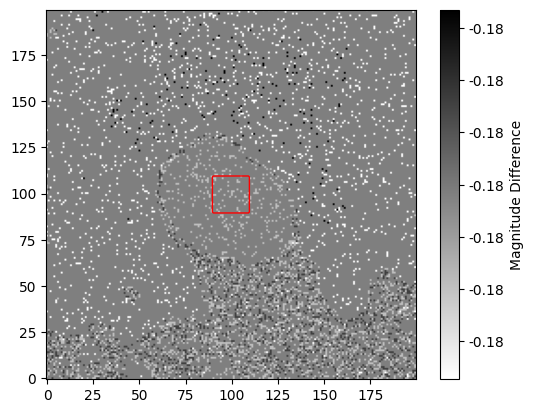

Holmberg mag threshold is 26.72


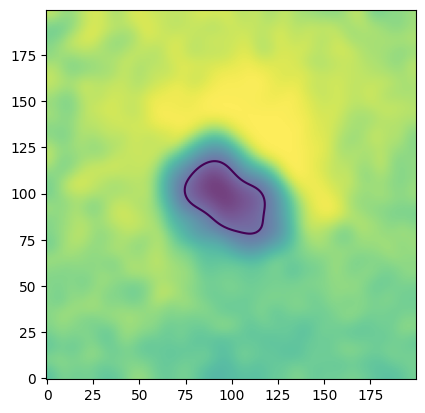

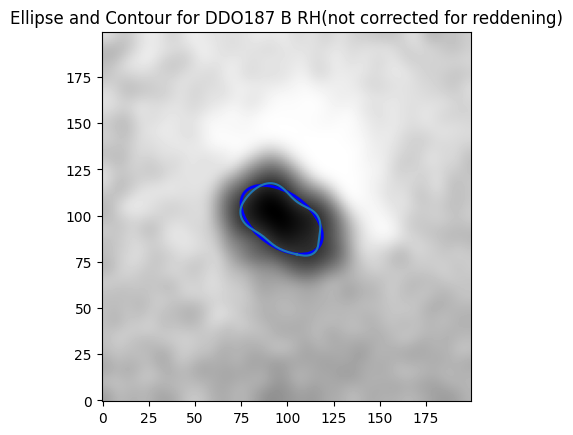

RH for DDO187 is: 0.3422937318615779 kpc
Paper value is 0.77 kpc
Holmberg RH for DDO187 is: 0.342 ± 0.004 kpc
Paper value is 0.77 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22)
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.77 kpc")

# Extract 1σ uncertainty for a_H from the covariance matrix (index 2)
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]  # uncertainty in a_H

# Propagate uncertainty into RH (in kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000

# Report RH with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 0.77 kpc")


# M81dwA

## R25

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1200.

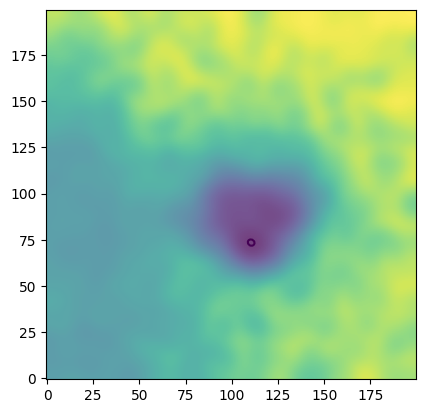

In [ ]:
starless_file_u = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwau.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwab.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwav.fits")
starless_v = starless_file_v[0].data

M81dwA = [starless_u , starless_b , starless_v]
galaxy_name = "M81dwA"
# Constants and parameters
pixel_scale = 1.134
D = 3.6
E_B_V = 0.02
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.31, 1.35, 1.42]
mU_values = [5.172179, 0.5305759, -0.1119325, 0.]
mV_values = [3.206747, 0.1810213, -0.01222482, 0.]
mB_values = [3.661739, 0.2671157, -0.01449246, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 100
box_size_y = 100
box_center = (460, 400)
image_boxes = [M81dwA[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(M81dwA))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()
'''
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c

# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")

'''
# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for M81dwA is:", RB_25 * 1000, "kpc")





## RH

Median of the center box: -0.14999301340408563


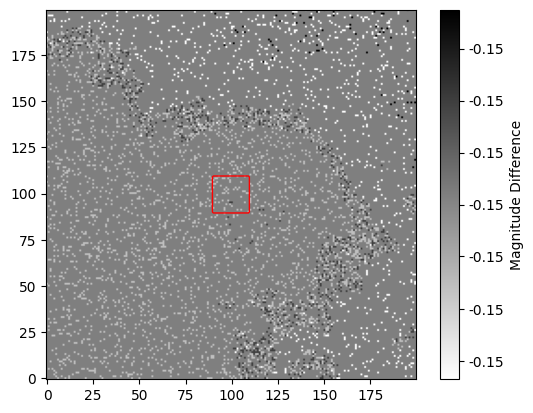

Holmberg mag threshold is 26.69765104100279


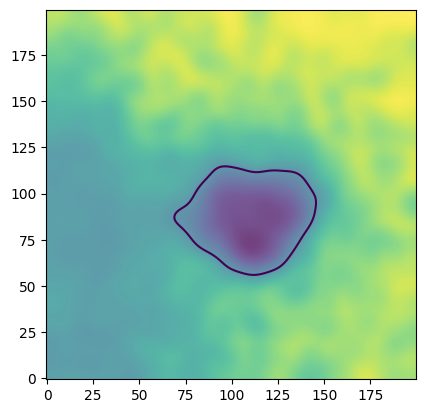

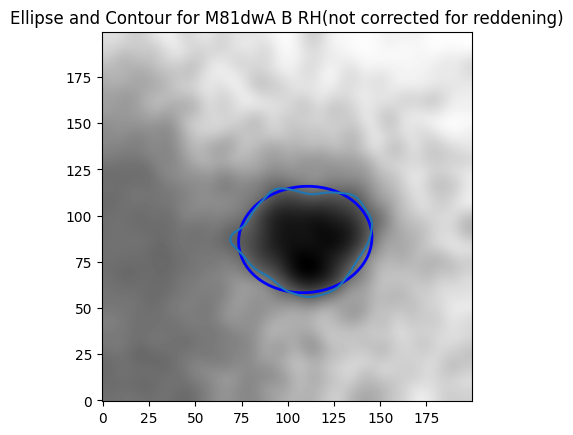

RH for M81dwA is: 0.7147284483099728 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")


# NGC 1156

## R25

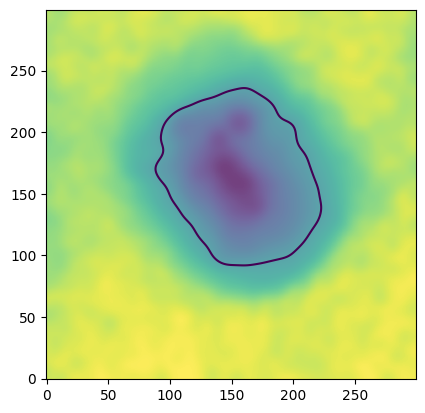

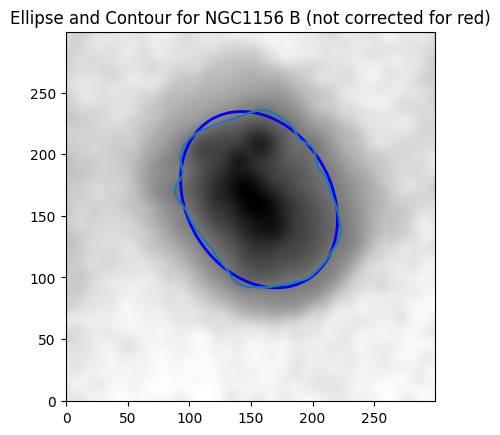

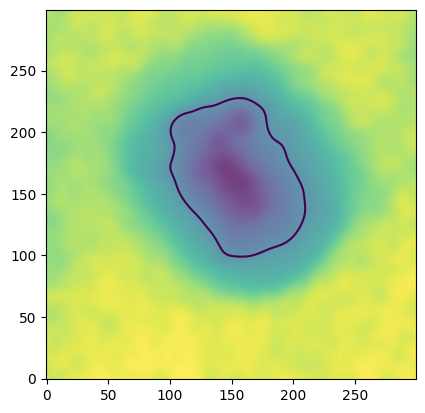

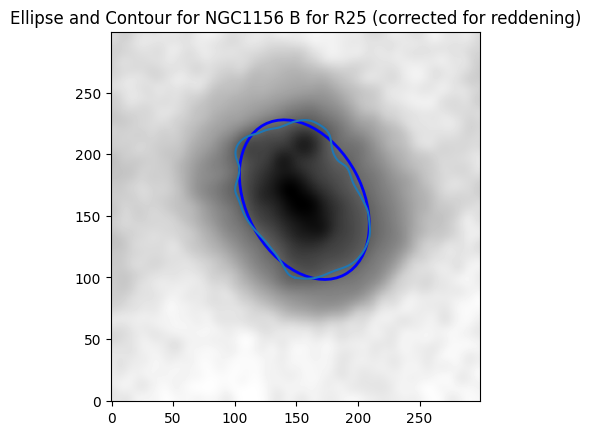

NOT corrected RB 25 for NGC1156 is: 3.247792696231926 kpc
Paper value is 3.8 kpc
CORRECTED RB 25 for NGC1156 is: 2.9608335256878004 kpc
Paper value is 3.8 kpc
CORRECTED RB 25 for NGC1156 is: 2.961 ± 0.015 kpc
Paper value is 3.8 kpc


In [128]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\final_n1156u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\final_n1156b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\final_n1156v.fits")
starless_v = starless_file_v[0].data

NGC1156 = [starless_u , starless_b , starless_v]
galaxy_name = "NGC1156"
# Constants and parameters
pixel_scale = 1.134
D = 7.8
E_B_V = 0.17
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.02, 1.07, 1.24]
mU_values = [4.97379, 0.6303594, -0.0947, 0.]
mV_values = [3.22, 0.1205604, -0.0141, 0.]
mB_values = [3.652, 0.2300204, -0.0153, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 150
box_size_y = 150
box_center = (460, 480)
image_boxes = [NGC1156[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(NGC1156))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for NGC1156 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for NGC1156 is:", RB_25 * 1000, "kpc")
print("Paper value is 3.8 kpc")

a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 3.8 kpc")

# Extract the 1σ uncertainty for b_c (semi-minor axis)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # in pixels

# Propagate into RB_25_c using standard linear error propagation
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # convert to kpc

# Final result with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 3.8 kpc")



Median of the center box: -0.2783657785836323


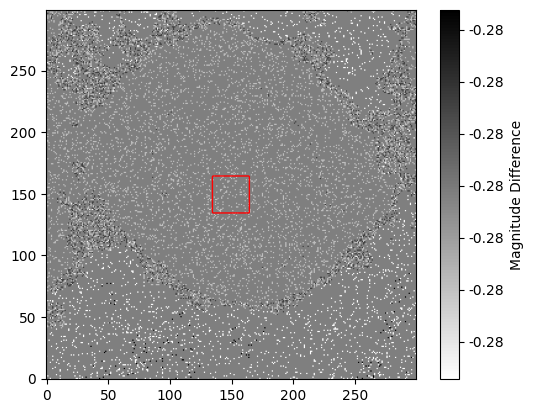

Holmberg mag threshold is 26.678523498991037


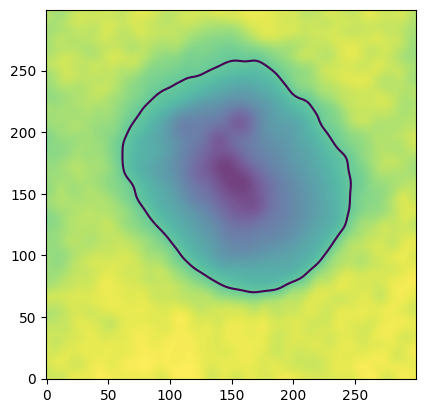

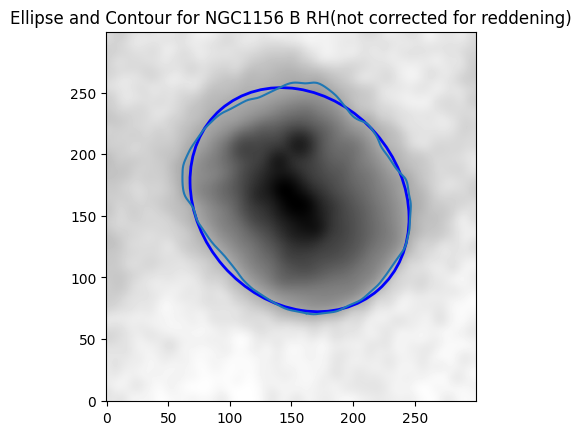

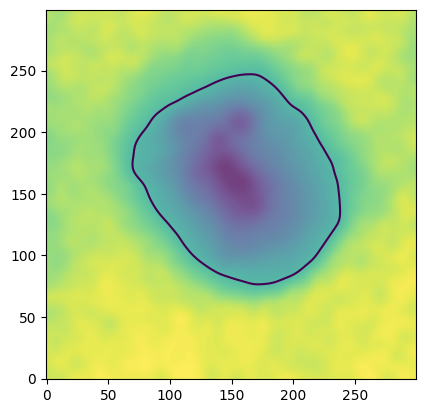

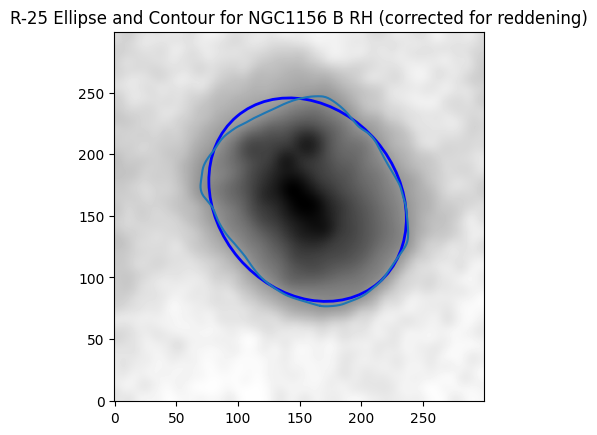

NOT corrected RH for NGC1156 is: 3.5162862084442543 kpc
CORRECTED RB 25 for NGC1156 is: 3.802546784678943 kpc
Paper value is 4.86 kpc
CORRECTED RH for NGC1156 is: 3.803 ± 0.012 kpc
Paper value is 4.86 kpc


In [132]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 150, 150
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 4.86 kpc")

# Extract 1σ uncertainty on a_c_H (index 2 in covariance matrix)
sigma_a_c_H = np.sqrt(np.diag(pcov_25_c_H))[2]  # pixels

# Propagate into RH_c using linear error formula
sigma_RH_c = (D * pixel_scale / 206265) * sigma_a_c_H * 1000  # convert to kpc

# Print Holmberg radius with uncertainty
print(f"CORRECTED RH for {galaxy_name} is: {RH_c * 1000:.3f} ± {sigma_RH_c:.3f} kpc")
print("Paper value is 4.86 kpc")


# NGC 1569

# R25

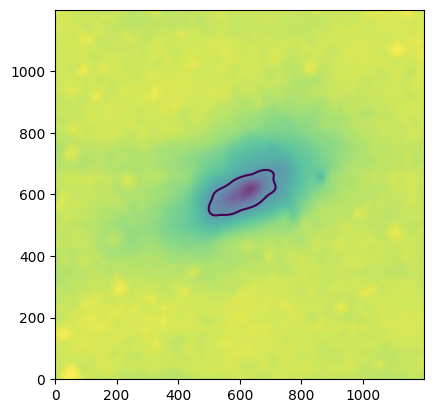

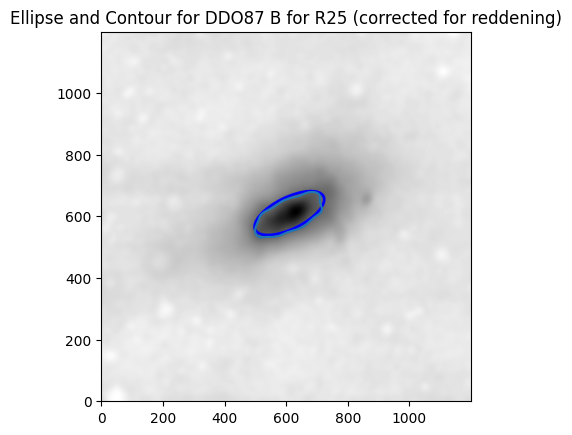

RB 25 for DDO87 is: 0.6281991826151954 kpc
not reported
RB 25 for DDO87 is: 0.628 ± 0.002 kpc


In [133]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1569\final_n1569u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1569\final_n1569b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1569\final_n1569v.fits")
starless_v = starless_file_v[0].data

NGC1569 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO87"
# Constants and parameters
pixel_scale = 0.42
D = 2.5
E_B_V = 0.51
filters = ["U", "B", "V"]
airmass_values=[1.2, 1.19, 1.19]
exposures = [600, 180, 60]
mU_values = [1.336326, 0.5622226, -0.1036324, 0.]
mB_values = [-0.2246805, 0.2901735, -0.03218131, 0.]
mV_values = [-0.3788421, 0.2121398, 0.001862769, 0]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 600
box_size_y = 600
box_center = [1050, 1100]

image_boxes = []
for i in range(0 , len(NGC1569)):
        box = NGC1569[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("not reported")

# Extract 1σ uncertainty for a_c from covariance matrix (index 2 = a_c)
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]

# Propagate into RB_25_c using linear error formula
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # result in kpc

# Report RB_25 with uncertainty
print(f"RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")


# RH

Median of the center box: 0.9863893180197962


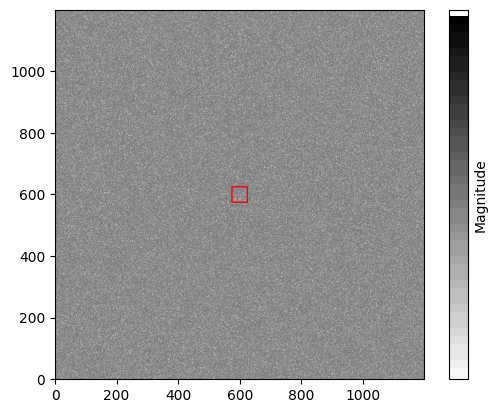

Holmberg mag threshold is 26.86697200838495


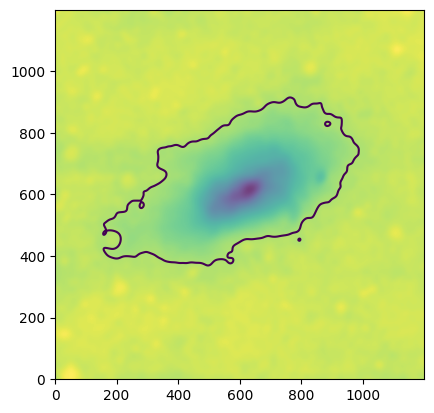

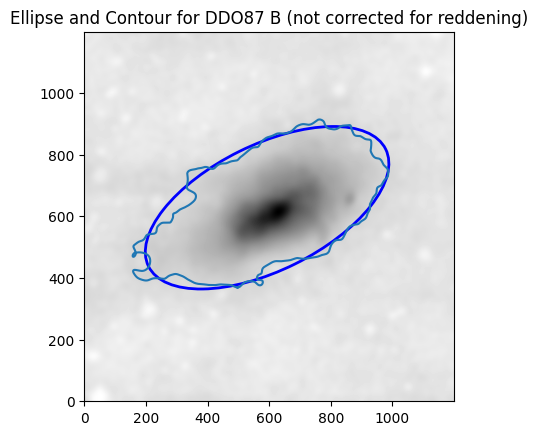

RH for DDO87 is: 2.1858484126006674 kpc
not reported
Holmberg RH for DDO87 is: 2.186 ± 0.006 kpc


In [134]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("not reported")

# Extract 1σ uncertainty for a_H from covariance matrix (index 2 corresponds to a_H)
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]

# Propagate into RH uncertainty (in kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000

# Final output with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")



# NGC 2366

# R25

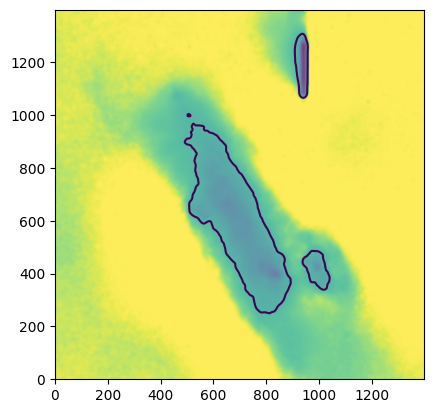

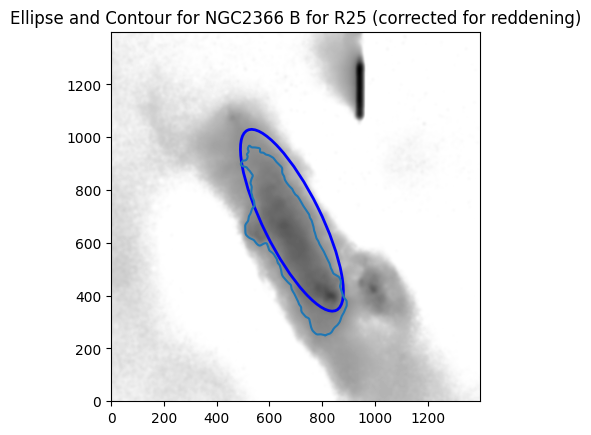

RB 25 for NGC2366 is: 2.4768207275521315 kpc
RB 25 for NGC2366 is 2.75 in the paper.
CORRECTED RB 25 for NGC2366 is: 2.477 ± 0.014 kpc
Paper value is 2.75 kpc


In [135]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 2366\final_n2366u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 2366\final_n2366B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 2366\final_n2366V.fits")
starless_v = starless_file_v[0].data

NGC2366 = [starless_u , starless_b , starless_v]
galaxy_name = "NGC2366"
# Constants and parameters
pixel_scale = 0.42
D = 3.2
E_B_V = 0.04
filters = ["U", "B", "V"]
airmass_values=[1.32, 1.26, 1.25]
exposures = [1800, 480, 180]
mU_values = [0.1001485, 0.08258455, 0.01287872, 0.]
mB_values = [0.07697853, 0.0647294, 0.02438456, 0.]
mV_values = [-0.3681273, 0.2220466, 0.0130948, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 700
box_size_y = 700
box_center = [1000, 1100]

image_boxes = []
for i in range(0 , len(NGC2366)):
        box = NGC2366[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print(F"RB 25 for {galaxy_name} is 2.75 in the paper.")

# Extract the 1σ uncertainty for b_c (semi-minor axis)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # in pixels

# Propagate into RB_25 error using standard linear error propagation
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # convert to kpc

# Final output with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 2.75 kpc")



# RH

Median of the center box: 0.8060129607935558


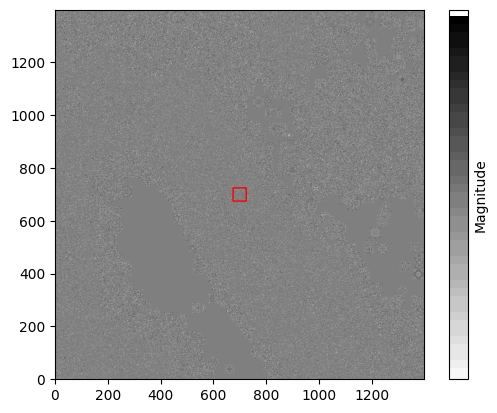

Holmberg mag threshold is 26.84009593115824


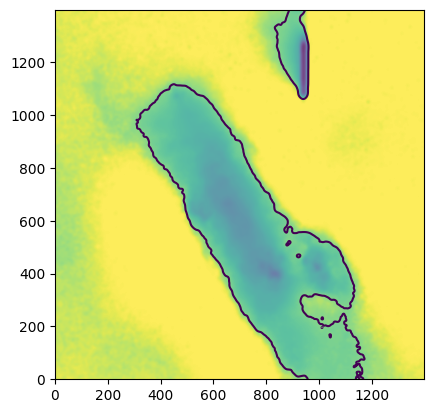

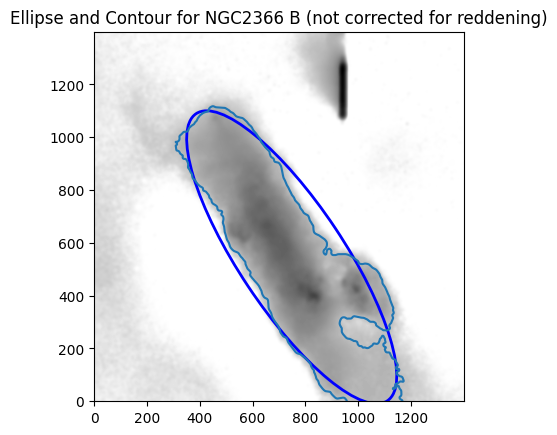

RH for NGC2366 is: 4.257150798300667 kpc
RH for NGC2366 is 4.4 in the paper.
Holmberg RH for NGC2366 is: 4.257 ± 0.025 kpc
Paper value is 4.4 kpc


In [136]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print(f"RH for {galaxy_name} is 4.4 in the paper.")
# Extract 1σ uncertainty for b_H (index 3 in the covariance matrix)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # uncertainty in b_H (pixels)

# Propagate into RH uncertainty (in kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Final output
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 4.4 kpc")



# NGC 4163 

# R25

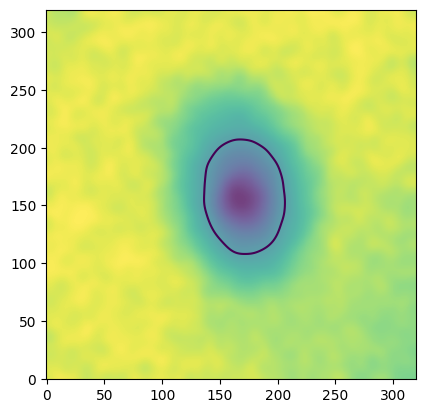

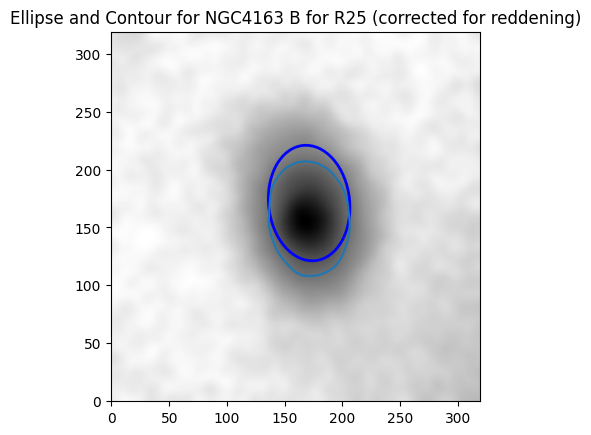

RB 25 for NGC4163 is: 0.7718658259681331 kpc
paper vlaue : 0.73 kpc
CORRECTED RB 25 for NGC4163 is: 0.772 ± 0.001 kpc
Paper value is 0.73 kpc


In [137]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4163\final_n4163u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4163\final_n4163b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4163\final_n4163v.fits")
starless_v = starless_file_v[0].data

NGC4163 = [starless_u , starless_b , starless_v]
galaxy_name = "NGC4163"
# Constants and parameters
pixel_scale = 1.134
D = 2.8
E_B_V = 0
filters = ["U", "B", "V"]
airmass_values=[1.17, 1.26, 1.38]
exposures = [1800, 1800, 1800]
mU_values = [5.172179, 0.5305759, -0.1119325, 0.]
mB_values = [3.661739, 0.2671157, -0.01449246, 0.]
mV_values = [3.206747, 0.1810213, -0.01222482, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 160
box_size_y = 160
box_center = [420, 480]

image_boxes = []
for i in range(0 , len(NGC4163)):
        box = NGC4163[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("paper vlaue : 0.73 kpc")
# Extract 1σ uncertainty for b_c from the covariance matrix (index 3 = b_c)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # in pixels

# Propagate into RB_25_c (convert to kpc)
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # kpc

# Final output with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 0.73 kpc")



# RH

Median of the center box: -0.5634709440000023


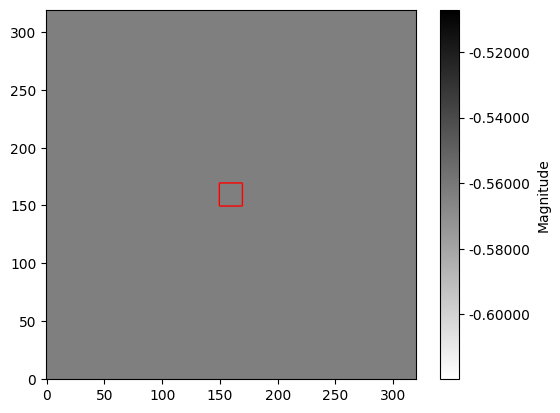

Holmberg mag threshold is 26.636042829344


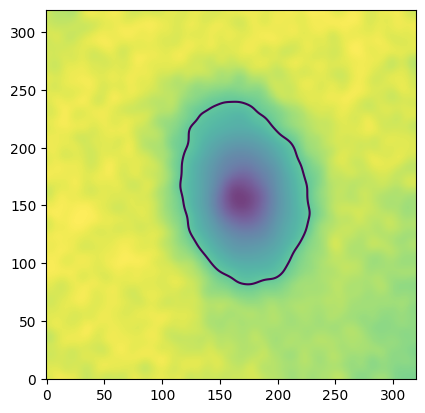

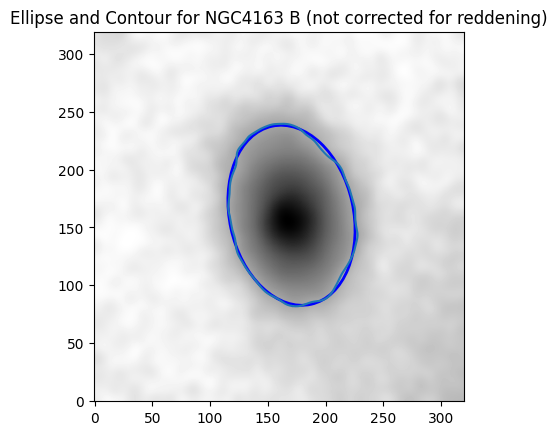

RH for NGC4163 is: 1.2145465036293897 kpc
RH for NGC4163 is 1.2 in the paper.
Holmberg RH for NGC4163 is: 1.215 ± 0.002 kpc
Paper value is 1.2 kpc


In [138]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print(f"RH for {galaxy_name} is 1.2 in the paper.")
# Extract 1σ uncertainty for b_H from the covariance matrix
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # index 3 corresponds to b_H

# Propagate into RH error (convert to kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Final output with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 1.2 kpc")


# NGC 4214

# R25

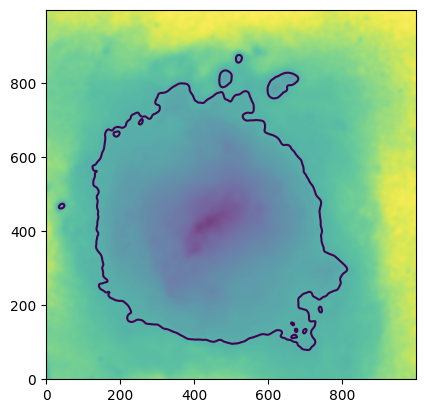

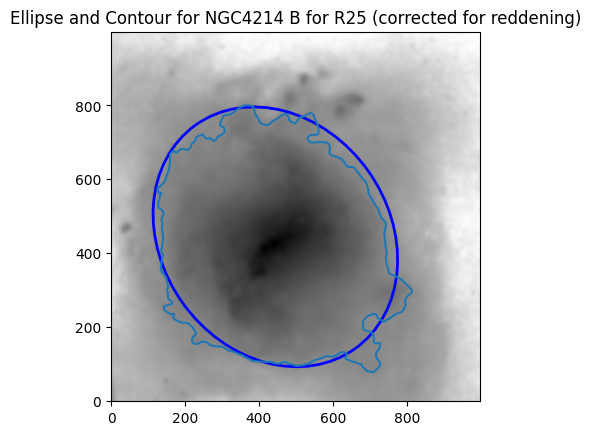

RB 25 for NGC4214 is: 2.1937719440052117 kpc
paper vlaue : 2.89 kpc
CORRECTED RB 25 for NGC4214 is: 2.194 ± 0.004 kpc
Paper value is 2.89 kpc


In [139]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4214\final_n4214u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4214\final_n4214b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 4214\final_n4214v.fits")
starless_v = starless_file_v[0].data

NGC4163 = [starless_u , starless_b , starless_v]
galaxy_name = "NGC4214"
# Constants and parameters
pixel_scale = 0.42
D = 2.9
E_B_V = 0
filters = ["U", "B", "V"]
airmass_values=[1.05, 1.015, 1.005]
exposures = [600, 480, 180]
mU_values = [1.679049, 0.3572555, -0.0400845, 0.]
mB_values = [-0.0829096, 0.2040792, -0.005089185, 0.]
mV_values = [-0.3681273, 0.2220466, 0.0130948, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 500
box_size_y = 500
box_center = [1100, 1100]

image_boxes = []
for i in range(0 , len(NGC4163)):
        box = NGC4163[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("paper vlaue : 2.89 kpc")
# Extract 1σ uncertainty for b_c (semi-minor axis, index 3)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # in pixels

# Propagate into RB_25_c using standard linear error propagation
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000  # result in kpc

# Final output with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 2.89 kpc")


Median of the center box: 0.8173055642759763


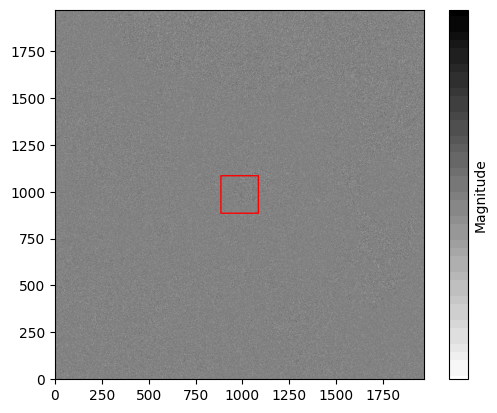

Holmberg mag threshold is 26.841778529077118


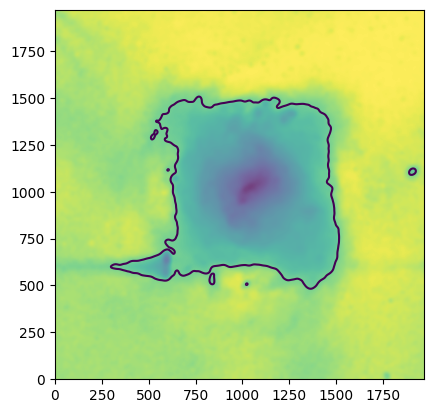

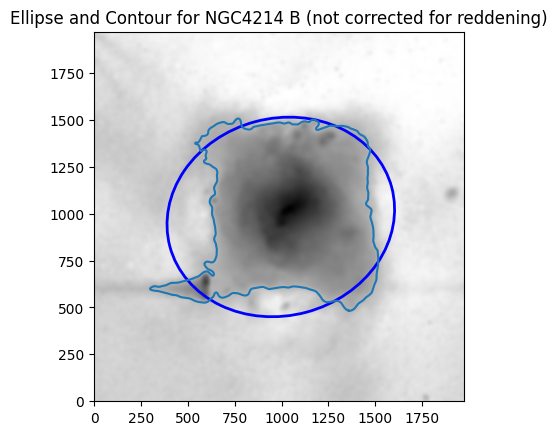

RH for NGC4214 is: 3.6165961285397823 kpc
RH for NGC4214 is 3.94 in the paper.
Holmberg RH for NGC4214 is: 3.617 ± 0.019 kpc
Paper value is 3.94 kpc


In [140]:
box_size_x = 1000
box_size_y = 1000
box_center = [1100, 1100]

image_boxes = []
for i in range(0 , len(NGC4163)):
        box = NGC4163[i]#[box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 10)[2]

import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 200

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print(f"RH for {galaxy_name} is 3.94 in the paper.")
# Extract uncertainty from ellipse fit (index 2 corresponds to a_H)
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]  # in pixels

# Propagate uncertainty through physical radius formula
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000  # in kpc

# Report the result
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 3.94 kpc")



# UGC 8508

# R25

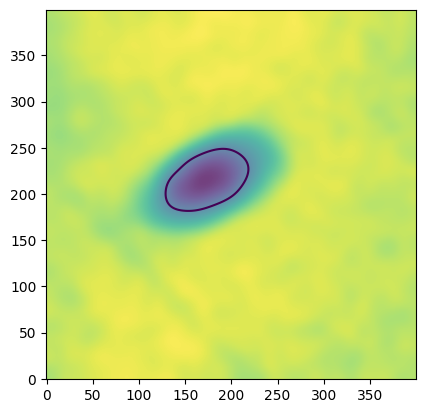

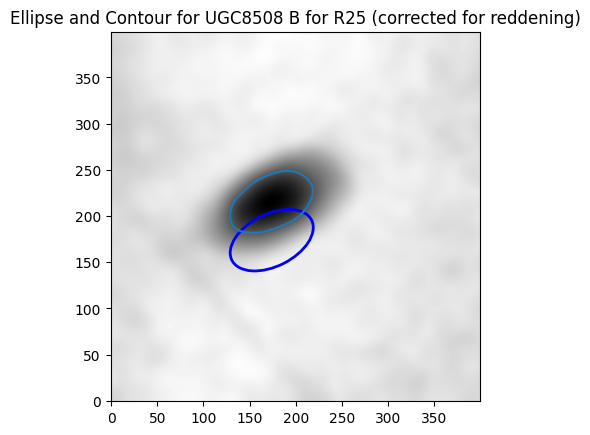

RB 25 for UGC8508 is: 0.6900337015166813 kpc
paper vlaue : 0.64 kpc
CORRECTED RB 25 for UGC8508 is: 0.690 ± 0.001 kpc
Paper value is 0.64 kpc


In [141]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\U8508\final_u8508u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\U8508\final_u8508b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\U8508\final_u8508v.fits")
starless_v = starless_file_v[0].data

NGC4163 = [starless_u , starless_b , starless_v]
galaxy_name = "UGC8508"
# Constants and parameters
pixel_scale = 1.134
D = 2.6
E_B_V = 0
filters = ["U", "B", "V"]
airmass_values=[1.31, 1.13, 1.06]
exposures = [1800, 1800, 1200]
mU_values = [5.065, 0.514, -0.146, 0]
mB_values = [3.434, 0.3398903, -0.0157, 0.]
mV_values = [3.009, 0.2183592, 0.0415, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 200
box_size_y = 200
box_center = [450, 450]

image_boxes = []
for i in range(0 , len(NGC4163)):
        box = NGC4163[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("paper vlaue : 0.64 kpc")
# Extract 1σ uncertainty on a_c from the ellipse fit
sigma_a_c = np.sqrt(np.diag(pcov_25_c))[2]  # pixels

# Propagate into RB_25 uncertainty (in kpc)
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_a_c * 1000  # convert to kpc

# Report result with error
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 0.64 kpc")


Median of the center box: -0.0969209453158335


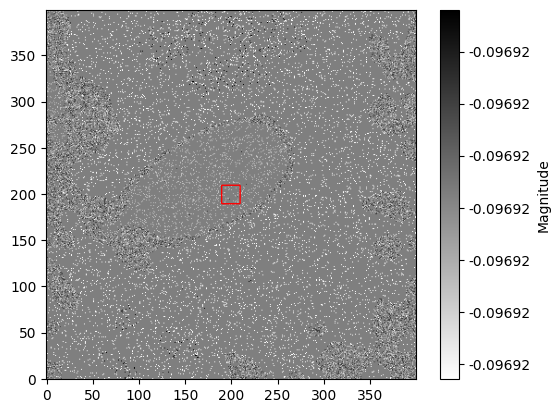

Holmberg mag threshold is 26.70555877914794


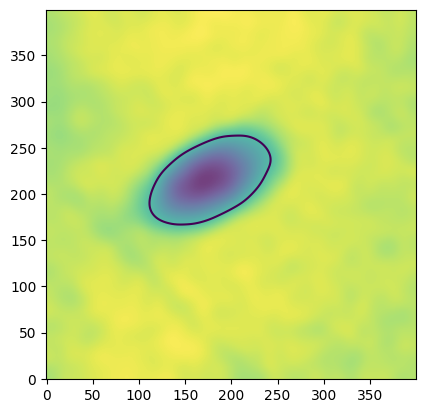

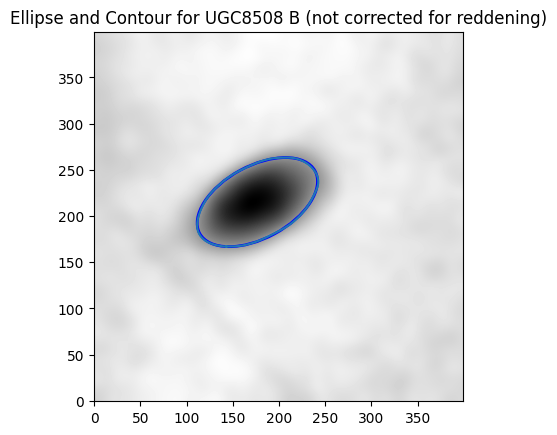

RH for UGC8508 is: 1.0144328451567863 kpc
RH for UGC8508 is 0.96 in the paper.
Holmberg RH for UGC8508 is: 1.014 ± 0.001 kpc
Paper value is 0.96 kpc


In [142]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print(f"RH for {galaxy_name} is 0.96 in the paper.")
# Extract 1σ uncertainty for a_H (semi-major axis)
sigma_a_H = np.sqrt(np.diag(pcov_25_H))[2]  # in pixels

# Propagate uncertainty into RH (converted to kpc)
sigma_RH = (D * pixel_scale / 206265) * sigma_a_H * 1000  # result in kpc

# Print RH with its uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 0.96 kpc")


# WLM

# R25

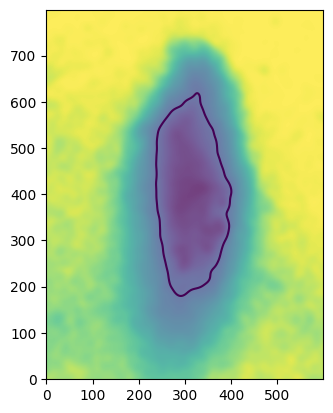

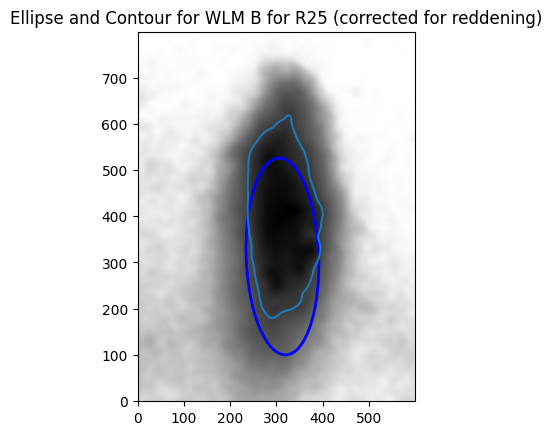

RB 25 for WLM is: 1.171406584202147 kpc
paper vlaue : 0.99 kpc
CORRECTED RB 25 for WLM is: 1.171 ± 0.004 kpc
Paper value is 0.99 kpc


In [143]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\WLM\final_wLMu.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\WLM\final_wLMb.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\WLM\final_wLMb.fits")
starless_v = starless_file_v[0].data

WLM = [starless_u , starless_b , starless_v]
galaxy_name = "WLM"
# Constants and parameters
pixel_scale = 1.134
D = 1
E_B_V = 0.02
filters = ["U", "B", "V"]
airmass_values=[1.60, 1.66, 1.57]
exposures = [2400, 2400, 1200]
mU_values = [5.04, 0.463949, -0.112, 0.]
mB_values = [3.388, 0.2456194, -0.0237, 0.]
mV_values = [3.082, 0.1349849, -0.0157, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 300
box_size_y = 400
box_center = [500, 500]

image_boxes = []
for i in range(0 , len(WLM)):
        box = WLM[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c, maxfev = 5000)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc_c, xc_c), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("paper vlaue : 0.99 kpc")
# Extract 1σ uncertainty for b_c (semi-minor axis)
sigma_b_c = np.sqrt(np.diag(pcov_25_c))[3]  # in pixels

# Propagate into RB_25_c uncertainty (convert to kpc)
sigma_RB_25_c = (D * pixel_scale / 206265) * sigma_b_c * 1000

# Final output with uncertainty
print(f"CORRECTED RB 25 for {galaxy_name} is: {RB_25_c * 1000:.3f} ± {sigma_RB_25_c:.3f} kpc")
print("Paper value is 0.99 kpc")


# RH

Median of the center box: 0.2689423190732363


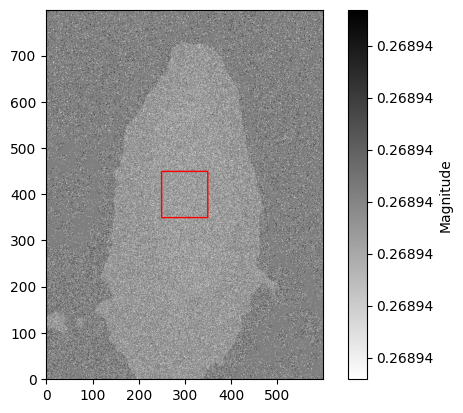

Holmberg mag threshold is 26.760072405541912


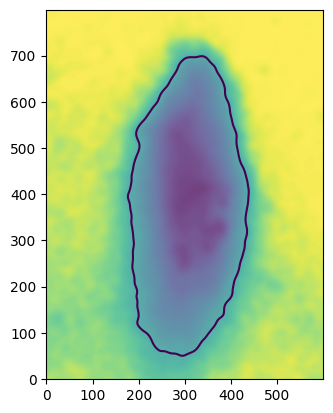

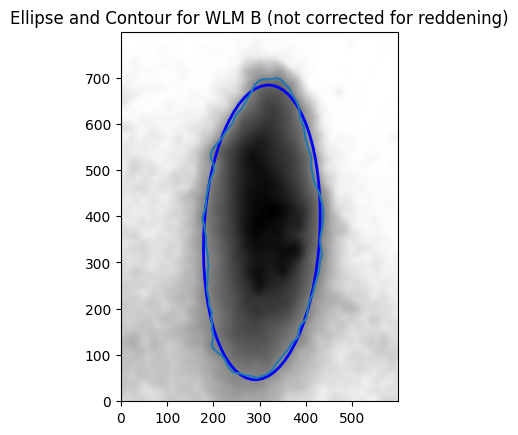

RH for WLM is: 1.7547550638298115 kpc
RH for WLM is 1.69 in the paper.
Holmberg RH for WLM is: 1.755 ± 0.003 kpc
Paper value is 1.69 kpc


In [144]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 100

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print(f"RH for {galaxy_name} is 1.69 in the paper.")
# Extract 1σ uncertainty for b_H (semi-minor axis)
sigma_b_H = np.sqrt(np.diag(pcov_25_H))[3]  # in pixels

# Convert to physical uncertainty in kpc
sigma_RH = (D * pixel_scale / 206265) * sigma_b_H * 1000

# Final output with uncertainty
print(f"Holmberg RH for {galaxy_name} is: {RH * 1000:.3f} ± {sigma_RH:.3f} kpc")
print("Paper value is 1.69 kpc")


# Scatter Plot

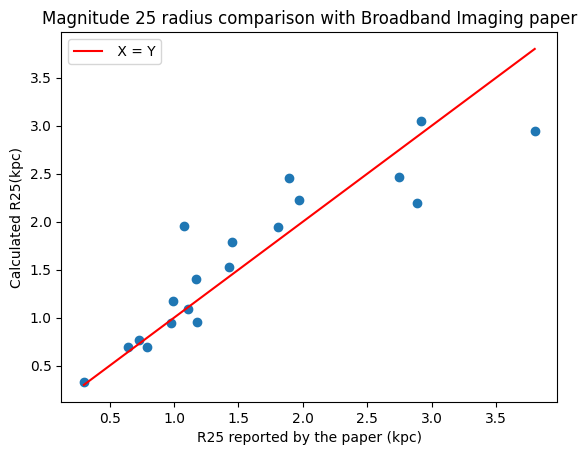

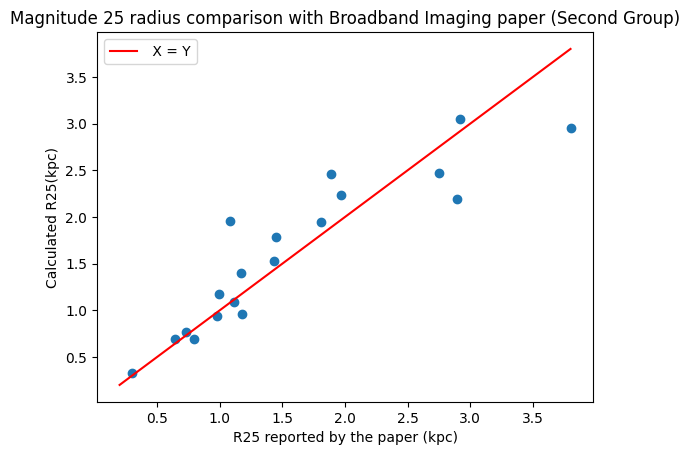

In [ ]:
R_25_us = [0.94, 0.96, 1.96, 3.05, 0.69, 1.53, 0.33, 1.95, 1.4, 2.46, 1.09, 2.23, 1.79, 2.95, 2.47, 0.77, 2.19, 0.69, 1.17]
R_25_pa = [0.98, 1.18, 1.08, 2.92, 0.79, 1.43, 0.3, 1.81, 1.17, 1.89, 1.11, 1.97, 1.45, 3.80, 2.75, 0.73, 2.89, 0.64, 0.99]
plt.scatter(R_25_pa, R_25_us)
min_val = min(min(R_25_pa), min(R_25_us)) 
max_val = max(max(R_25_pa), max(R_25_us)) 
line_values = np.linspace(min_val, max_val, 1000) 
plt.plot(line_values, line_values, color='red' , label = " X = Y")
plt.xlabel("R25 reported by the paper (kpc)")
plt.ylabel("Calculated R25(kpc)")
plt.title("Magnitude 25 radius comparison with Broadband Imaging paper")
plt.legend()
plt.show()


# Second groups
R_25_us_2 = [0.96, 1.96, 3.05, 0.69, 1.53, 2.95, 2.47, 0.77, 2.19, 0.69, 1.17]
R_25_pa_2 = [1.18, 1.08, 2.92, 0.79, 1.43, 3.80, 2.75, 0.73, 2.89, 0.64, 0.99]
plt.scatter(R_25_pa, R_25_us)
min_val = min(min(R_25_pa_2), min(R_25_us_2)) 
max_val = max(max(R_25_pa_2), max(R_25_us_2)) 
line_values = np.linspace(0.2, max_val, 1000) 
plt.plot(line_values, line_values, color='red' , label = " X = Y")
plt.xlabel("R25 reported by the paper (kpc)")
plt.ylabel("Calculated R25(kpc)")
plt.title("Magnitude 25 radius comparison with Broadband Imaging paper (Second Group)")
plt.legend()
plt.show()

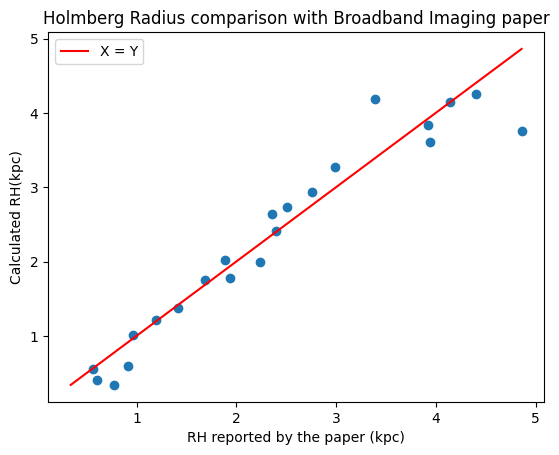

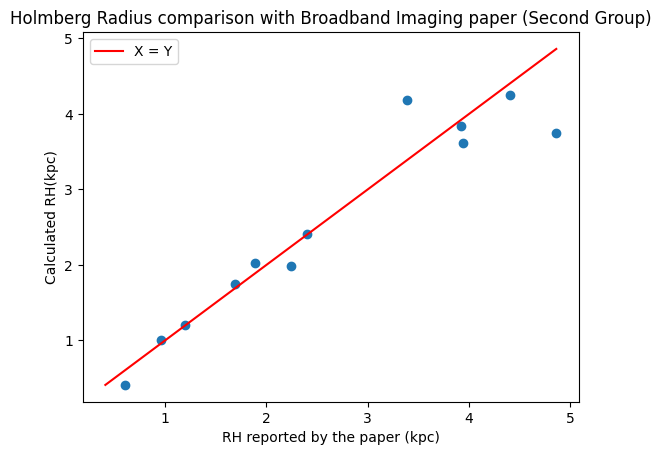

In [ ]:
R_H_us = [1.38, 4.18, 3.84, 2.02, 2.41, 1.99, 0.56, 2.93, 2.74, 4.14, 1.78, 0.41, 3.27, 0.59, 2.64, 0.34, 3.75, 4.25, 1.21, 3.61, 1.01, 1.75]
R_H_pa = [1.42, 3.39, 3.92, 1.89, 2.40, 2.24, 0.56, 2.76, 2.51, 4.14, 1.94, 0.60, 2.99, 0.91, 2.36, 0.77, 4.86, 4.40, 1.20, 3.94, 0.96, 1.69]
plt.scatter(R_H_pa, R_H_us)
min_val = min(min(R_H_pa), min(R_H_us)) 
max_val = max(max(R_H_pa), max(R_H_us)) 
line_values = np.linspace(min_val, max_val, 100) 
plt.plot(line_values, line_values, color='red', label = "X = Y")
plt.title("Holmberg Radius comparison with Broadband Imaging paper" )
plt.xlabel("RH reported by the paper (kpc)")
plt.ylabel("Calculated RH(kpc)")
plt.legend()
plt.show()

R_H_us_2 = [4.18, 3.84, 2.02, 2.41, 1.99, 0.41, 3.75, 4.25, 1.21, 3.61, 1.01, 1.75]
R_H_pa_2 = [3.39, 3.92, 1.89, 2.40, 2.24, 0.60, 4.86, 4.40, 1.20, 3.94, 0.96, 1.69]
plt.scatter(R_H_pa_2, R_H_us_2)
min_val = min(min(R_H_pa_2), min(R_H_us_2)) 
max_val = max(max(R_H_pa_2), max(R_H_us_2)) 
line_values = np.linspace(min_val, max_val, 100) 
plt.plot(line_values, line_values, color='red', label = "X = Y")
plt.title("Holmberg Radius comparison with Broadband Imaging paper (Second Group)" )
plt.xlabel("RH reported by the paper (kpc)")
plt.ylabel("Calculated RH(kpc)")
plt.legend()
plt.show()

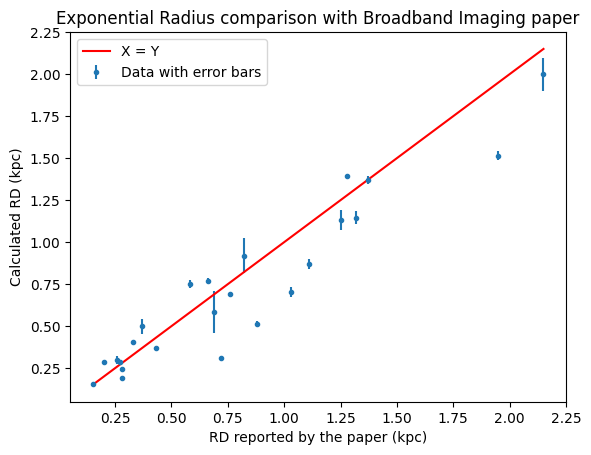

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
R_D_us =       [0.372, 0.704, 1.369, 0.870, 0.689, 1.131, 0.299, 1.146, 0.513, 1.998, 0.585, 0.154, 1.515, 0.405, 0.769, 0.287, 0.498, 0.919, 0.191, 1.395, 0.244, 0.310, 0.286, 0.749]
R_D_us_error = [0.002, 0.029, 0.025, 0.031, 0.011, 0.061, 0.025, 0.039, 0.019, 0.099, 0.125, 0.003, 0.027, 0.007, 0.015, 0.014, 0.046, 0.103, 0.012, 0.002, 0.001, 0.004, 0.005, 0.024]
R_D_pa =       [0.43,  1.03,  1.37,  1.11,  0.76,  1.25,  0.26,  1.32,  0.88,  2.15,  0.69,  0.15,  1.95,  0.33,  0.66,  0.2,  0.37,   0.82,  0.28,  1.28,  0.28,  0.72,  0.27,  0.58]

# Scatter plot with error bars
plt.errorbar(R_D_pa, R_D_us[:len(R_D_pa)], yerr=R_D_us_error[:len(R_D_pa)], fmt='.', label='Data with error bars')

# Diagonal line
min_val = min(min(R_D_pa), min(R_D_us)) 
max_val = max(max(R_D_pa), max(R_D_us)) 
line_values = np.linspace(min_val, max_val, 100) 
plt.plot(line_values, line_values, color='red', label='X = Y')

# Plot details
plt.title('Exponential Radius comparison with Broadband Imaging paper')
plt.xlabel('RD reported by the paper (kpc)')
plt.ylabel('Calculated RD (kpc)')
plt.legend()
plt.show()



In [ ]:
RD_total_hist = np.abs(np.array(R_D_us) - np.array(R_D_pa))
plt.hist(RD_total_hist, bins = 10)
plt.title("Calculated and Paper Differences for RD (All galaxies)")
plt.show()

R25_total_hist = np.abs(np.array([R_25_us]) - np.array(R_25_pa))
plt.hist(R25_total_hist, bins = 5)
plt.title("Calculated and Paper Differences for R25 (All galaxies)")
plt.show()

R25_2nd_hist = np.abs(np.array(R_25_us_2) - np.array(R_25_pa_2))
plt.hist(R25_total_hist, bins = 5)
plt.title("Calculated and Paper Differences for R25 (2nd Group)")
plt.show()


RH_total_hist = np.abs(np.array(R_H_us) - np.array(R_H_pa))
plt.hist(RH_total_hist, bins = 10)
plt.title("Calculated and Paper Differences for RH (All galaxies)")
plt.show()

RH_2nd_hist = np.abs(np.array(R_H_us_2) - np.array(R_H_pa_2))
plt.hist(RH_2nd_hist, bins = 10)
plt.title("Calculated and Paper Differences for RH (2nd Group)")
plt.show()

NameError: name 'R_D_us' is not defined